# Amazon Fine Food Reviews Analysis


Data Source: https://www.kaggle.com/snap/amazon-fine-food-reviews <br>

EDA: https://nycdatascience.com/blog/student-works/amazon-fine-foods-visualization/


The Amazon Fine Food Reviews dataset consists of reviews of fine foods from Amazon.<br>

Number of reviews: 568,454<br>
Number of users: 256,059<br>
Number of products: 74,258<br>
Timespan: Oct 1999 - Oct 2012<br>
Number of Attributes/Columns in data: 10 

Attribute Information:

1. Id
2. ProductId - unique identifier for the product
3. UserId - unqiue identifier for the user
4. ProfileName
5. HelpfulnessNumerator - number of users who found the review helpful
6. HelpfulnessDenominator - number of users who indicated whether they found the review helpful or not
7. Score - rating between 1 and 5
8. Time - timestamp for the review
9. Summary - brief summary of the review
10. Text - text of the review


#### Objective:
Given a review, determine whether the review is positive (rating of 4 or 5) or negative (rating of 1 or 2).

<br>
[Q] How to determine if a review is positive or negative?<br>
<br> 
[Ans] We could use Score/Rating. A rating of 4 or 5 can be cosnidered as a positive review. A rating of 1 or 2 can be considered as negative one. A review of rating 3 is considered nuetral and such reviews are ignored from our analysis. This is an approximate and proxy way of determining the polarity (positivity/negativity) of a review.




# [1]. Reading Data

## [1.1] Loading the data

The dataset is available in two forms
1. .csv file
2. SQLite Database

In order to load the data, We have used the SQLITE dataset as it is easier to query the data and visualise the data efficiently.
<br> 

Here as we only want to get the global sentiment of the recommendations (positive or negative), we will purposefully ignore all Scores equal to 3. If the score is above 3, then the recommendation wil be set to "positive". Otherwise, it will be set to "negative".

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")


import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

C:\Users\chait\Anaconda3\lib\site-packages\gensim\utils.py:1212: UserWarning: detected Windows; aliasing chunkize to chunkize_serial
  warnings.warn("detected Windows; aliasing chunkize to chunkize_serial")


In [3]:
# using SQLite Table to read data.
con = sqlite3.connect('database.sqlite') 

# filtering only positive and negative reviews i.e. 
# not taking into consideration those reviews with Score=3
# SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000, will give top 500000 data points
# you can change the number to any other number based on your computing power

# filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 500000""", con) 
# for tsne assignment you can take 5k data points

filtered_data = pd.read_sql_query(""" SELECT * FROM Reviews WHERE Score != 3 LIMIT 100000""", con) 

# Give reviews with Score>3 a positive rating(1), and reviews with a score<3 a negative rating(0).
def partition(x):
    if x < 3:
        return 0
    return 1

#changing reviews with score less than 3 to be positive and vice-versa
actualScore = filtered_data['Score']
positiveNegative = actualScore.map(partition) 
filtered_data['Score'] = positiveNegative
print("Number of data points in our data", filtered_data.shape)
filtered_data.head(3)

Number of data points in our data (100000, 10)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,1,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,0,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,1,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...


In [4]:
display = pd.read_sql_query("""
SELECT UserId, ProductId, ProfileName, Time, Score, Text, COUNT(*)
FROM Reviews
GROUP BY UserId
HAVING COUNT(*)>1
""", con)

In [5]:
print(display.shape)
display.head()

(80668, 7)


,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
0,#oc-R115TNMSPFT9I7,B007Y59HVM,Breyton,1331510400,2,Overall its just OK when considering the price...,2
1,#oc-R11D9D7SHXIJB9,B005HG9ET0,"Louis E. Emory ""hoppy""",1342396800,5,"My wife has recurring extreme muscle spasms, u...",3
2,#oc-R11DNU2NBKQ23Z,B007Y59HVM,Kim Cieszykowski,1348531200,1,This coffee is horrible and unfortunately not ...,2
3,#oc-R11O5J5ZVQE25C,B005HG9ET0,Penguin Chick,1346889600,5,This will be the bottle that you grab from the...,3
4,#oc-R12KPBODL2B5ZD,B007OSBE1U,Christopher P. Presta,1348617600,1,I didnt like this coffee. Instead of telling y...,2


In [6]:
display[display['UserId']=='AZY10LLTJ71NX']

,UserId,ProductId,ProfileName,Time,Score,Text,COUNT(*)
80638,AZY10LLTJ71NX,B006P7E5ZI,"undertheshrine ""undertheshrine""",1334707200,5,I was recommended to try green tea extract to ...,5


In [7]:
display['COUNT(*)'].sum()

393063

#  [2] Exploratory Data Analysis

## [2.1] Data Cleaning: Deduplication

It is observed (as shown in the table below) that the reviews data had many duplicate entries. Hence it was necessary to remove duplicates in order to get unbiased results for the analysis of the data.  Following is an example:

In [8]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND UserId="AR5J8UI46CURR"
ORDER BY ProductID
""", con)
display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,78445,B000HDL1RQ,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
1,138317,B000HDOPYC,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
2,138277,B000HDOPYM,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
3,73791,B000HDOPZG,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...
4,155049,B000PAQ75C,AR5J8UI46CURR,Geetha Krishnan,2,2,5,1199577600,LOACKER QUADRATINI VANILLA WAFERS,DELICIOUS WAFERS. I FIND THAT EUROPEAN WAFERS ...


As it can be seen above that same user has multiple reviews with same values for HelpfulnessNumerator, HelpfulnessDenominator, Score, Time, Summary and Text and on doing analysis it was found that <br>
<br> 
ProductId=B000HDOPZG was Loacker Quadratini Vanilla Wafer Cookies, 8.82-Ounce Packages (Pack of 8)<br>
<br> 
ProductId=B000HDL1RQ was Loacker Quadratini Lemon Wafer Cookies, 8.82-Ounce Packages (Pack of 8) and so on<br>

It was inferred after analysis that reviews with same parameters other than ProductId belonged to the same product just having different flavour or quantity. Hence in order to reduce redundancy it was decided to eliminate the rows having same parameters.<br>

The method used for the same was that we first sort the data according to ProductId and then just keep the first similar product review and delelte the others. for eg. in the above just the review for ProductId=B000HDL1RQ remains. This method ensures that there is only one representative for each product and deduplication without sorting would lead to possibility of different representatives still existing for the same product.

In [9]:
#Sorting data according to ProductId in ascending order
sorted_data=filtered_data.sort_values('ProductId', axis=0, ascending=True, inplace=False, kind='quicksort', na_position='last')

In [10]:
#Deduplication of entries
final=sorted_data.drop_duplicates(subset={"UserId","ProfileName","Time","Text"}, keep='first', inplace=False)
final.shape

(87775, 10)

In [11]:
#Checking to see how much % of data still remains
(final['Id'].size*1.0)/(filtered_data['Id'].size*1.0)*100

87.775

<b>Observation:-</b> It was also seen that in two rows given below the value of HelpfulnessNumerator is greater than HelpfulnessDenominator which is not practically possible hence these two rows too are removed from calcualtions

In [12]:
display= pd.read_sql_query("""
SELECT *
FROM Reviews
WHERE Score != 3 AND Id=44737 OR Id=64422
ORDER BY ProductID
""", con)

display.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,64422,B000MIDROQ,A161DK06JJMCYF,"J. E. Stephens ""Jeanne""",3,1,5,1224892800,Bought This for My Son at College,My son loves spaghetti so I didn't hesitate or...
1,44737,B001EQ55RW,A2V0I904FH7ABY,Ram,3,2,4,1212883200,Pure cocoa taste with crunchy almonds inside,It was almost a 'love at first bite' - the per...


In [13]:
final=final[final.HelpfulnessNumerator<=final.HelpfulnessDenominator]

In [14]:
#Before starting the next phase of preprocessing lets see the number of entries left
print(final.shape)

#How many positive and negative reviews are present in our dataset?
final['Score'].value_counts()

(87773, 10)


1    73592
0    14181
Name: Score, dtype: int64

#  [3] Preprocessing

## [3.1].  Preprocessing Review Text

Now that we have finished deduplication our data requires some preprocessing before we go on further with analysis and making the prediction model.

Hence in the Preprocessing phase we do the following in the order below:-

1. Begin by removing the html tags
2. Remove any punctuations or limited set of special characters like , or . or # etc.
3. Check if the word is made up of english letters and is not alpha-numeric
4. Check to see if the length of the word is greater than 2 (as it was researched that there is no adjective in 2-letters)
5. Convert the word to lowercase
6. Remove Stopwords
7. Finally Snowball Stemming the word (it was obsereved to be better than Porter Stemming)<br>

After which we collect the words used to describe positive and negative reviews

In [15]:
# printing some random reviews
sent_0 = final['Text'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Text'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Text'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Text'].values[4900]
print(sent_4900)
print("="*50)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.
The Candy Blocks were a nice visual for the Lego Birthday party but the candy has little taste to it.  Very little of the 2 lbs that I bought were eaten and I threw the rest away.  I would not buy the candy again.
was way to hot for my blood, took a bite and did a jig  lol
My dog LOVES these treats. They tend to have a very strong fish oil smell. So if you are afraid of the fishy smell, don't get it. But I think my dog likes it because of the smell. These treats are really small in size. They are great for training. You can give your dog several of these without worrying about him over eating. Amazon's price was much more reasonable than any other retailer. You can buy a

In [16]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.


In [17]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.
The Candy Blocks were a nice visual for the Lego Birthday party but the candy has little taste to it.  Very little of the 2 lbs that I bought were eaten and I threw the rest away.  I would not buy the candy again.
was way to hot for my blood, took a bite and did a jig  lol
My dog LOVES these treats. They tend to have a very strong fish oil smell. So if you are afraid of the fishy smell, don't get it. But I think my dog likes it because of the smell. These treats are really small in size. They are great for training. You can give your dog several of these without worrying about him over eating. Amazon's price was much more reasonable than any other retailer. You can buy a

In [18]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [19]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)

was way to hot for my blood, took a bite and did a jig  lol


In [20]:
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)

My dogs loves this chicken but its a product from China, so we wont be buying it anymore.  Its very hard to find any chicken products made in the USA but they are out there, but this one isnt.  Its too bad too because its a good product but I wont take any chances till they know what is going on with the china imports.


In [21]:
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

was way to hot for my blood took a bite and did a jig lol


In [22]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [23]:
# Combining all the above stundents 
from tqdm import tqdm
preprocessed_reviews = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Text'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_reviews.append(sentance.strip())

100%|██████████████████████████████████████████████████████████████████████████| 87773/87773 [00:38<00:00, 2257.66it/s]


In [24]:
preprocessed_reviews[1500]

'way hot blood took bite jig lol'

<h2><font color='red'>[3.2] Preprocessing Review Summary</font></h2>

In [25]:
# preprocessing for review summary.
# printing some random reviews
sent_0 = final['Summary'].values[0]
print(sent_0)
print("="*50)

sent_1000 = final['Summary'].values[1000]
print(sent_1000)
print("="*50)

sent_1500 = final['Summary'].values[1500]
print(sent_1500)
print("="*50)

sent_4900 = final['Summary'].values[4900]
print(sent_4900)
print("="*50)

made in china
Not much taste
hot stuff
Great value


In [26]:
# remove urls from text python: https://stackoverflow.com/a/40823105/4084039
sent_0 = re.sub(r"http\S+", "", sent_0)
sent_1000 = re.sub(r"http\S+", "", sent_1000)
sent_150 = re.sub(r"http\S+", "", sent_1500)
sent_4900 = re.sub(r"http\S+", "", sent_4900)

print(sent_0)

made in china


In [27]:
# https://stackoverflow.com/questions/16206380/python-beautifulsoup-how-to-remove-all-tags-from-an-element
from bs4 import BeautifulSoup

soup = BeautifulSoup(sent_0, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1000, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_1500, 'lxml')
text = soup.get_text()
print(text)
print("="*50)

soup = BeautifulSoup(sent_4900, 'lxml')
text = soup.get_text()
print(text)

made in china
Not much taste
hot stuff
Great value


In [28]:
# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase

In [29]:
sent_1500 = decontracted(sent_1500)
print(sent_1500)
print("="*50)
#remove words with numbers python: https://stackoverflow.com/a/18082370/4084039
sent_0 = re.sub("\S*\d\S*", "", sent_0).strip()
print(sent_0)
print("="*50)
#remove spacial character: https://stackoverflow.com/a/5843547/4084039
sent_1500 = re.sub('[^A-Za-z0-9]+', ' ', sent_1500)
print(sent_1500)

hot stuff
made in china
hot stuff


In [30]:
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
# <br /><br /> ==> after the above steps, we are getting "br br"
# we are including them into stop words list
# instead of <br /> if we have <br/> these tags would have revmoved in the 1st step

stopwords= set(['br', 'the', 'i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"])

In [31]:
# Combining all the above words 
from tqdm import tqdm
preprocessed_summary = []
# tqdm is for printing the status bar
for sentance in tqdm(final['Summary'].values):
    sentance = re.sub(r"http\S+", "", sentance)
    sentance = BeautifulSoup(sentance, 'lxml').get_text()
    sentance = decontracted(sentance)
    sentance = re.sub("\S*\d\S*", "", sentance).strip()
    sentance = re.sub('[^A-Za-z]+', ' ', sentance)
    # https://gist.github.com/sebleier/554280
    sentance = ' '.join(e.lower() for e in sentance.split() if e.lower() not in stopwords)
    preprocessed_summary.append(sentance.strip())

100%|██████████████████████████████████████████████████████████████████████████| 87773/87773 [00:26<00:00, 3253.74it/s]


In [32]:
preprocessed_summary[15000]

'good matcha better'

# [5] Assignment 10: K-Means, Agglomerative & DBSCAN Clustering

<ol>
    <li><strong>Apply K-means Clustering on these feature sets:</strong>
        <ul>
    <li><font color='red'>SET 1:</font>Review text, preprocessed one converted into vectors using (BOW)</li>
            <li><font color='red'>SET 2:</font>Review text, preprocessed one converted into vectors using (TFIDF)</li>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘k’ using the elbow-knee method (plot k vs inertia_)</li>
    <li>Once after you find the k clusters, plot the word cloud per each cluster so that at a single
go we can analyze the words in a cluster.</li>          
        </ul>
    </li>
    <br>
    <li><strong>Apply Agglomerative Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Apply agglomerative algorithm and try a different number of clusters like 2,5 etc.</li>
    <li>Same as that of K-means, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews or so(as this is very computationally expensive one)</li>
        </ul>
    </li>
    <br>
    <br>
    <li><strong>Apply DBSCAN Clustering on these feature sets:</strong>
        <ul>
            <li><font color='red'>SET 3:</font>Review text, preprocessed one converted into vectors using (AVG W2v)</li>
            <li><font color='red'>SET 4:</font>Review text, preprocessed one converted into vectors using (TFIDF W2v)</li>
    <li>Find the best ‘Eps’ using the <a href='https://stackoverflow.com/questions/12893492/choosing-eps-and-minpts-for-dbscan-r/48558030#48558030'>elbow-knee method.</a></li>
    <li>Same as before, plot word clouds for each cluster and summarize in your own words what that cluster is representing.</li>
            <li>You can take around 5000 reviews for this as well.</li>
        </ul>
    </li>
</ol>

## [5.1] K-Means Clustering

### [5.1.1] Applying K-Means Clustering on BOW,<font color='red'> SET 1</font>

In [99]:
# Picking the top 50k points  
X=preprocessed_reviews[:50000]

In [100]:
#BoW
count_vect = CountVectorizer(min_df=10,ngram_range=(1,4)) #in scikit-learn
count_vect.fit(X)
print("some feature names ", count_vect.get_feature_names()[:10])
print('='*50)

X_bow = count_vect.transform(X)
print("the type of count vectorizer ",type(X_bow))
print("the shape of out text BOW vectorizer ",X_bow.get_shape())
print("the number of unique words ", X_bow.get_shape()[1])

some feature names  ['abandon', 'abdominal', 'ability', 'able', 'able buy', 'able chew', 'able drink', 'able eat', 'able enjoy', 'able feed']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text BOW vectorizer  (50000, 31572)
the number of unique words  31572


In [466]:

from sklearn.cluster import KMeans

k_values = [5,10,20,30,40,50]
sum_sq_dist = []
for i in k_values:
    KM = KMeans(n_clusters=i, n_jobs=-1).fit(X_bow)
    sum_sq_dist.append(KM.inertia_)

In [467]:
sum_sq_dist

[3251923.9682627157,
 3198219.7640264602,
 3133376.3543579197,
 3093261.6292065517,
 3064474.6429586806,
 3042501.4762981157]

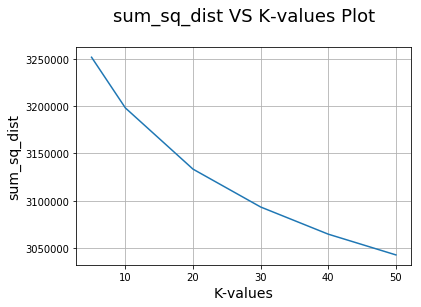

In [468]:

plt.plot(k_values, sum_sq_dist)
plt.xlabel('K-values',size=14)
plt.ylabel('sum_sq_dist',size=14)
plt.title('sum_sq_dist VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [107]:

from sklearn.cluster import KMeans
optimal_k = 20


# Implementing K-Means++ using optimal value of K
Kmeans = KMeans(n_clusters=optimal_k, n_jobs=-1).fit(X_bow)

In [108]:
Kmeans.labels_

array([2, 3, 2, ..., 3, 2, 3])

In [109]:
df1 = pd.DataFrame(X)
df1 = df1.rename(columns = {0 : 'preprocessed_reviews'})
df1.head(3)

,preprocessed_reviews
0,dogs loves chicken product china wont buying a...
1,dogs love saw pet store tag attached regarding...
2,infestation fruitflies literally everywhere fl...


In [110]:
df1['cluster_bow'] = Kmeans.labels_

In [111]:
for i in range(20):
    cluster = df1.preprocessed_reviews[df1['cluster_bow']==i]
    print("Number of reviews in ",i,"th cluster:",len(cluster))

Number of reviews in  0 th cluster: 773
Number of reviews in  1 th cluster: 11
Number of reviews in  2 th cluster: 5736
Number of reviews in  3 th cluster: 23851
Number of reviews in  4 th cluster: 748
Number of reviews in  5 th cluster: 363
Number of reviews in  6 th cluster: 538
Number of reviews in  7 th cluster: 2353
Number of reviews in  8 th cluster: 1
Number of reviews in  9 th cluster: 1147
Number of reviews in  10 th cluster: 327
Number of reviews in  11 th cluster: 11
Number of reviews in  12 th cluster: 440
Number of reviews in  13 th cluster: 1855
Number of reviews in  14 th cluster: 624
Number of reviews in  15 th cluster: 4945
Number of reviews in  16 th cluster: 406
Number of reviews in  17 th cluster: 5716
Number of reviews in  18 th cluster: 154
Number of reviews in  19 th cluster: 1


In [128]:
# Getting all the reviews in different clusters
c1 = []
c2 = []
c3 = []
c4 = []
c5 = []
c1 =  df1.preprocessed_reviews[df1['cluster_bow']==0]
c2 =  df1.preprocessed_reviews[df1['cluster_bow']==1]
c3 =  df1.preprocessed_reviews[df1['cluster_bow']==14]
c4 =  df1.preprocessed_reviews[df1['cluster_bow']==9]
c5 =  df1.preprocessed_reviews[df1['cluster_bow']==10]

### [5.1.2] Wordclouds of clusters obtained after applying k-means on BOW<font color='red'> SET 1</font>

In [121]:
from wordcloud import WordCloud
stopwords = set(stopwords)

In [122]:
def word_cloud(clusters):
    
    wordcloud = WordCloud(collocations=False, background_color ='black',stopwords = stopwords, 
                min_font_size = 10).generate(str(list(clusters)))
    plt.figure(figsize = (12, 10), facecolor = None) 
    plt.imshow(wordcloud,interpolation='bilinear') 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.title("Wordcloud for different clusters")
    plt.show() 

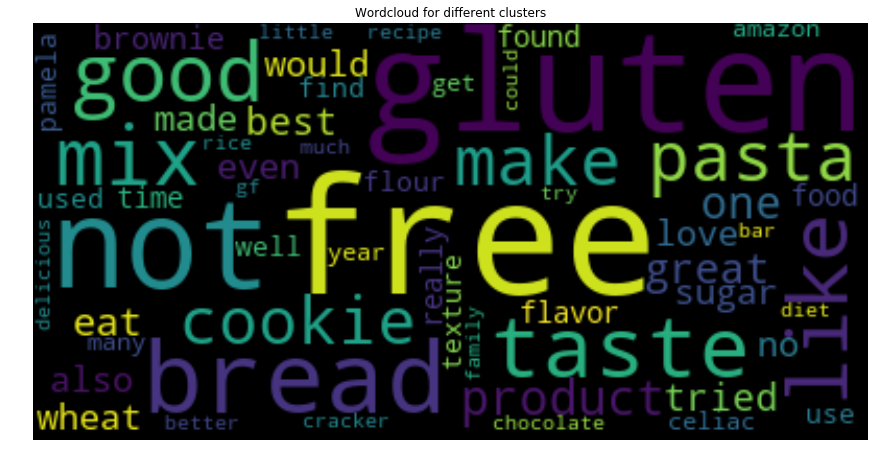

In [123]:
word_cloud(c1)

This cluster represents reviews about gluten free pasta.


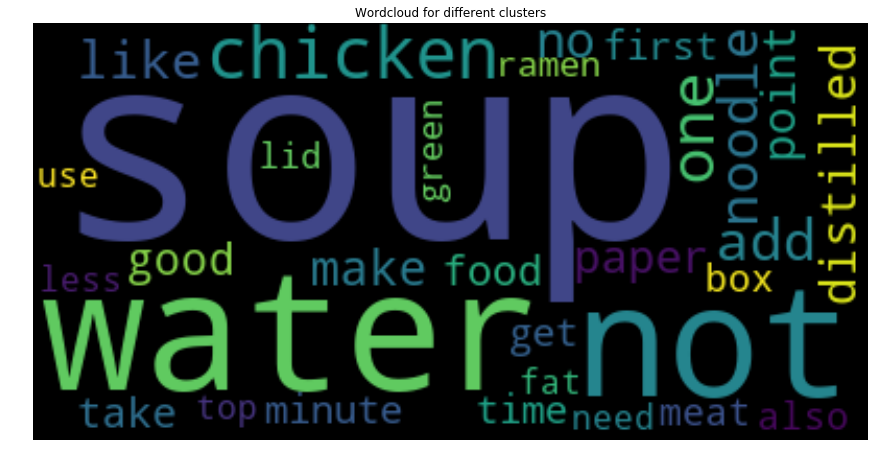

In [124]:
word_cloud(c2)

This cluster represents reviews about soup.
We can see that most repeated words are water,noodle etc..



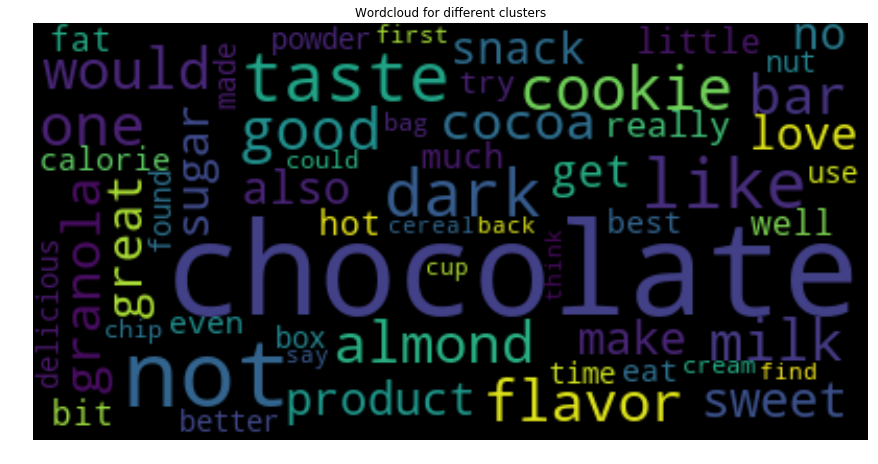

In [129]:
word_cloud(c3)

This cluster represents Chocolate,cookies and candy.

From the wordcloud we can say this product is good.

We can also observe different kinds of Chocolates such as dark chocolate,
hot chocolateetc etc..


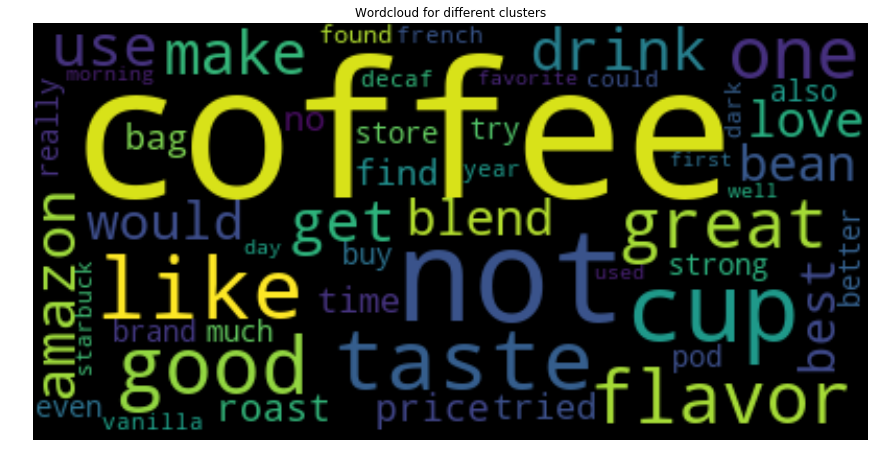

In [118]:
word_cloud(c4)

This cluster represents coffee.


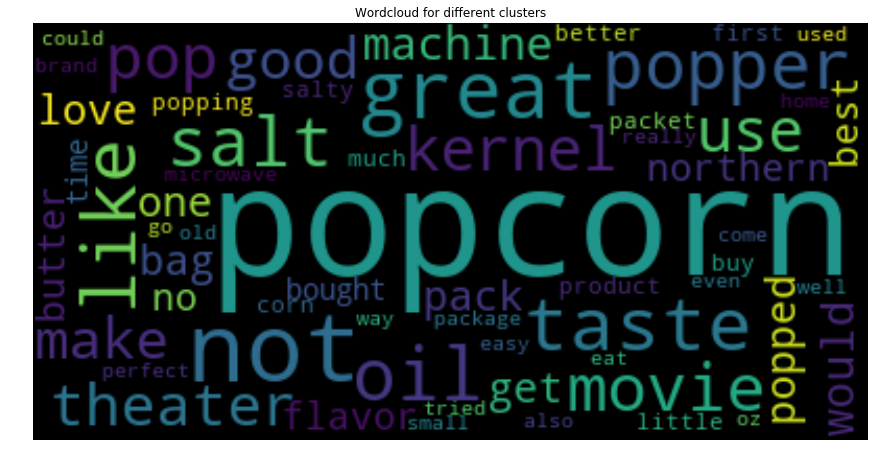

In [119]:
word_cloud(c5)

This cluster represents popcorn.


### [5.1.3] Applying K-Means Clustering on TFIDF,<font color='red'> SET 2</font>

In [469]:
tf_idf_vect = TfidfVectorizer(ngram_range=(1,2), min_df=10)
tf_idf_vect.fit(X)
print("some sample features(unique words in the corpus)",tf_idf_vect.get_feature_names()[0:10])
print('='*50)

X_tfidf = tf_idf_vect.transform(X)
print("the type of count vectorizer ",type(X_tfidf))
print("the shape of out text TFIDF vectorizer ",X_tfidf.get_shape())
print("the number of unique words including both unigrams and bigrams ", X_tfidf.get_shape()[1])

some sample features(unique words in the corpus) ['abandon', 'abdominal', 'ability', 'able', 'able buy', 'able chew', 'able drink', 'able eat', 'able enjoy', 'able feed']
the type of count vectorizer  <class 'scipy.sparse.csr.csr_matrix'>
the shape of out text TFIDF vectorizer  (50000, 29048)
the number of unique words including both unigrams and bigrams  29048


In [470]:
k_values = [5,10,20,30,40,50]
sum_sq_dist = []
for i in k_values:
    KM = KMeans(n_clusters=i, n_jobs=-1).fit(X_tfidf)
    sum_sq_dist.append(KM.inertia_)

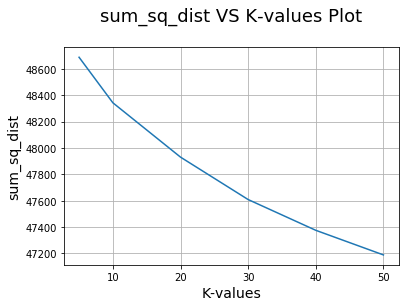

In [471]:

plt.plot(k_values, sum_sq_dist)
plt.xlabel('K-values',size=14)
plt.ylabel('sum_sq_dist',size=14)
plt.title('sum_sq_dist VS K-values Plot\n',size=18)
plt.grid()
plt.show()

From the above graph we can set optimal k is 10

In [473]:

optimal_k_tfidf = 10


# Implementing K-Means++ using optimal value of K
Kmeans_tfidf = KMeans(n_clusters=optimal_k_tfidf, n_jobs=-1).fit(X_tfidf)

In [474]:
df1['cluster_tfidf'] = Kmeans_tfidf.labels_

In [475]:
for i in range(10):
    cluster = df1.preprocessed_reviews[df1['cluster_tfidf']==i]
    print("Number of reviews in  ",i,"th cluster:",len(cluster))

Number of reviews in   0 th cluster: 2311
Number of reviews in   1 th cluster: 1459
Number of reviews in   2 th cluster: 2056
Number of reviews in   3 th cluster: 742
Number of reviews in   4 th cluster: 22061
Number of reviews in   5 th cluster: 1094
Number of reviews in   6 th cluster: 10800
Number of reviews in   7 th cluster: 4017
Number of reviews in   8 th cluster: 4090
Number of reviews in   9 th cluster: 1370


In [476]:
# Considering only 5 random clusters
c1 = []
c2 = []
c3 = []
c4 = []
c5 = []
c1 =  df1.preprocessed_reviews[df1['cluster_tfidf']==1]
c2 =  df1.preprocessed_reviews[df1['cluster_tfidf']==2]
c3 =  df1.preprocessed_reviews[df1['cluster_tfidf']==8]
c4 =  df1.preprocessed_reviews[df1['cluster_tfidf']==9]
c5 =  df1.preprocessed_reviews[df1['cluster_tfidf']==7]

### [5.1.4] Wordclouds of clusters obtained after applying k-means on TFIDF<font color='red'> SET 2</font>

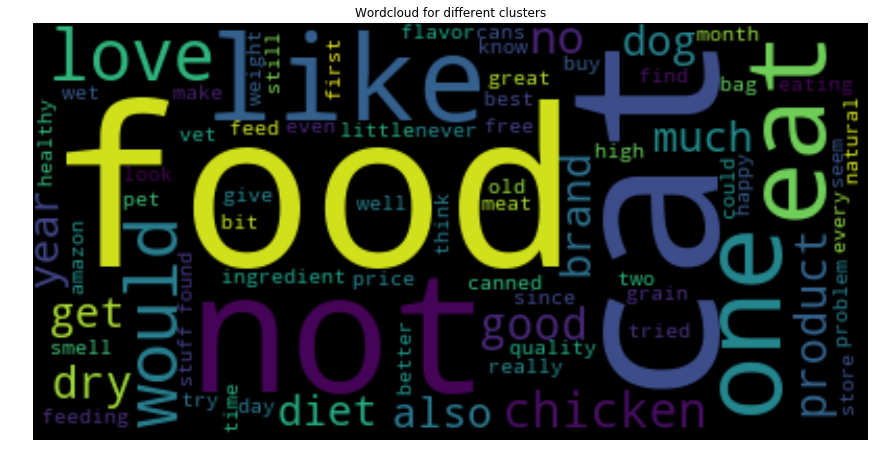

In [477]:
word_cloud(c1)

This cluster represents reviews about cat food.


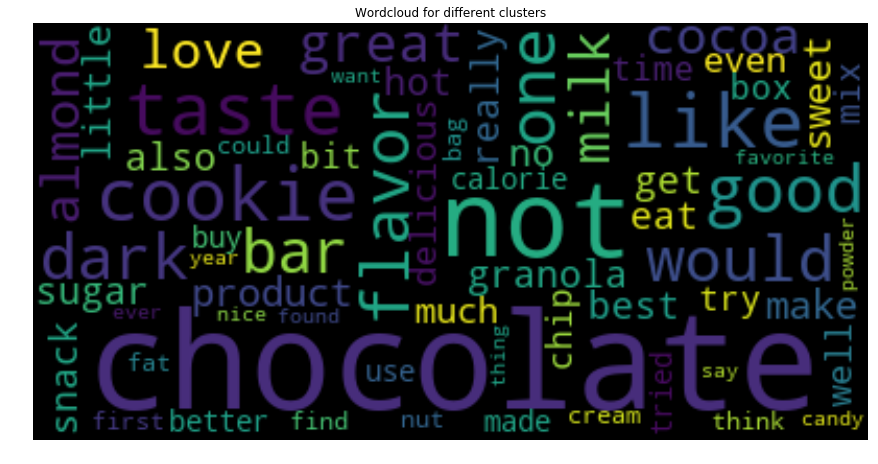

In [479]:
word_cloud(c2)

This cluster represents Chocolate,cookies and candy.

From the wordcloud we can say this product is good.

We can also observe different kinds of Chocolates such as dark chocolate,
hot chocolateetc,almond candy etc..

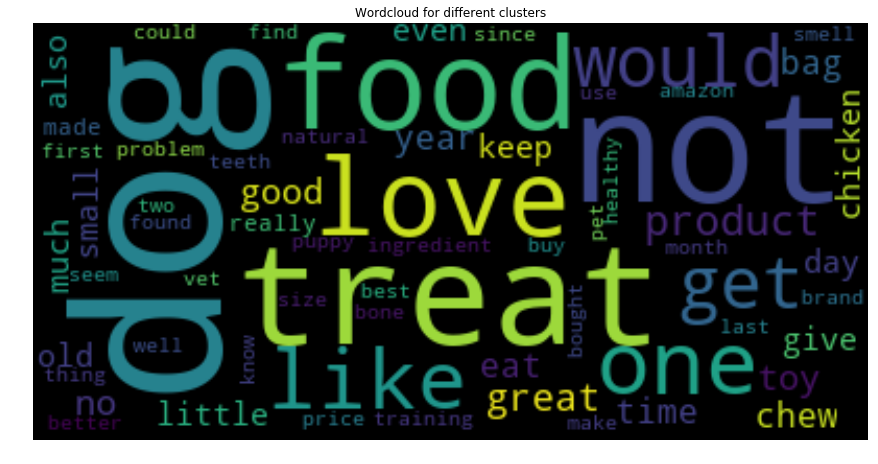

In [480]:
word_cloud(c3)

This cluster represents dog food.



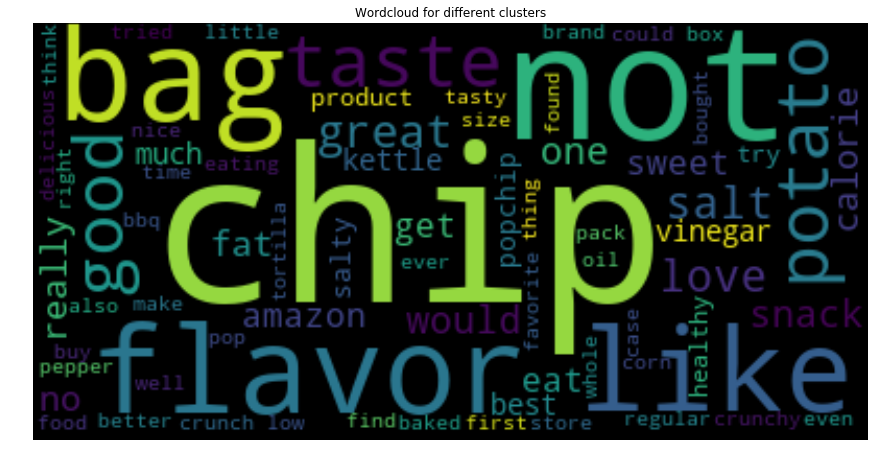

In [481]:
word_cloud(c4)

This cluster represents chips like potato chips.
We can observe from above that the reviews are about chips and repeated words about this product is that it is baked,crunchy,salty etc..


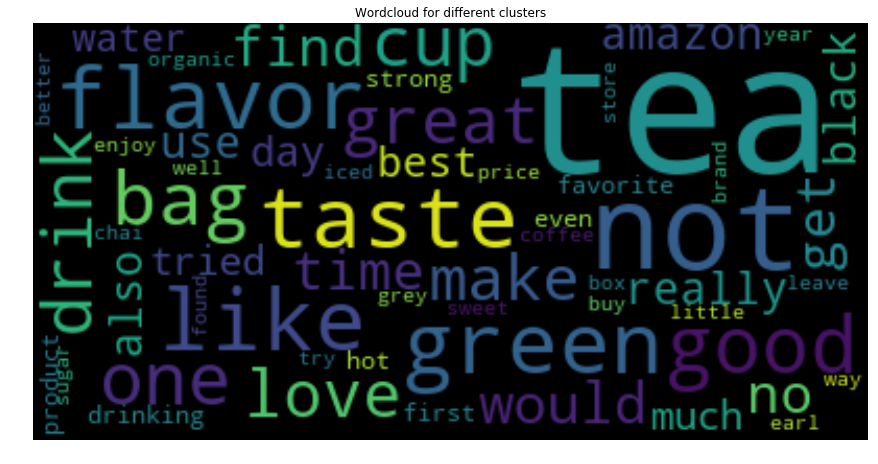

In [482]:
word_cloud(c5)

This cluster represents tea.
We can observe from above that the reviews are about tea and the repeated words are green tea,water,teabag etc..


### [5.1.5] Applying K-Means Clustering on AVG W2V,<font color='red'> SET 3</font>

In [486]:
X=preprocessed_reviews[:50000]

In [487]:
# Preparing Reviews for gensim model
i=0
list_of_sentance=[]
for sentance in X:
    list_of_sentance.append(sentance.split())

In [488]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors


In [489]:
# this line of code trains your w2v model on the give list of sentances
w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)

In [490]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  13402
sample words  ['dogs', 'loves', 'chicken', 'product', 'china', 'wont', 'buying', 'anymore', 'hard', 'find', 'products', 'made', 'usa', 'one', 'isnt', 'bad', 'good', 'take', 'chances', 'till', 'know', 'going', 'imports', 'love', 'saw', 'pet', 'store', 'tag', 'attached', 'regarding', 'satisfied', 'safe', 'infestation', 'literally', 'everywhere', 'flying', 'around', 'kitchen', 'bought', 'hoping', 'least', 'get', 'rid', 'weeks', 'fly', 'stuck', 'buggers', 'success', 'rate', 'day']


In [491]:
# Converting Reviews into Numerical Vectors using W2V vectors
from tqdm import tqdm
import numpy as np

In [492]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
print(sent_vectors.shape)
print(sent_vectors[5])

100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [02:15<00:00, 391.32it/s]


(50000, 50)
[ 0.26217677 -0.3395431   0.05586132 -0.25238639 -0.32713721 -0.25768638
 -0.2332234  -0.19104127  0.00307293 -0.16773889  0.87084871  0.06829898
  0.59343145 -0.29830375 -0.08172571 -0.2109484  -0.57070831  0.40940134
  0.35597884  0.12085828 -0.24576997 -0.70763714  0.02706042  0.14161106
 -0.14714967  0.07220721 -0.68352717 -0.30752193 -0.05611667  0.22576824
  0.30038011  0.22225946 -0.52962668 -0.23815477 -0.39862401  0.33373734
  0.30966756  0.0370189   0.03622897  0.3008146   0.12028549 -0.00183049
 -0.41165454 -0.08249435 -0.19270457  0.33248222  0.75923097 -0.40570237
  0.15091619 -0.13562659]


In [493]:
X_w2v = sent_vectors


In [494]:

k_values = [5,10,20,30,40,50]
sum_sq_dist = []
for i in k_values:
    KM = KMeans(n_clusters=i, n_jobs=-1).fit(X_w2v)
    sum_sq_dist.append(KM.inertia_)

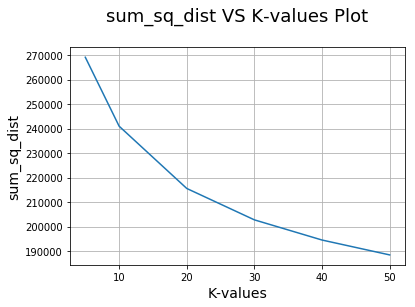

In [495]:

plt.plot(k_values, sum_sq_dist)
plt.xlabel('K-values',size=14)
plt.ylabel('sum_sq_dist',size=14)
plt.title('sum_sq_dist VS K-values Plot\n',size=18)
plt.grid()
plt.show()

From the above polt optimal k values is 20

In [496]:

optimal_k_w2v = 20


# Implementing K-Means++ using optimal value of K
Kmeans_w2v = KMeans(n_clusters=optimal_k_w2v, n_jobs=-1).fit(X_w2v)

In [497]:
df1['cluster_w2v'] = Kmeans_w2v.labels_

In [498]:
for i in range(20):
    cluster = df1.preprocessed_reviews[df1['cluster_w2v']==i]
    print("Length of ",i,"th cluster:",len(cluster))

Length of  0 th cluster: 2740
Length of  1 th cluster: 1758
Length of  2 th cluster: 2477
Length of  3 th cluster: 1928
Length of  4 th cluster: 3857
Length of  5 th cluster: 2690
Length of  6 th cluster: 3944
Length of  7 th cluster: 1994
Length of  8 th cluster: 2028
Length of  9 th cluster: 1749
Length of  10 th cluster: 2481
Length of  11 th cluster: 3578
Length of  12 th cluster: 1514
Length of  13 th cluster: 3111
Length of  14 th cluster: 2703
Length of  15 th cluster: 2972
Length of  16 th cluster: 2368
Length of  17 th cluster: 2437
Length of  18 th cluster: 1344
Length of  19 th cluster: 2327


In [519]:
# Getting only 5 random clusters

c1 = []
c2 = []
c3 = []
c4 = []
c5 = []
c1 =  df1.preprocessed_reviews[df1['cluster_w2v']==1]
c2 =  df1.preprocessed_reviews[df1['cluster_w2v']==12]
c3 =  df1.preprocessed_reviews[df1['cluster_w2v']==15]
c4 =  df1.preprocessed_reviews[df1['cluster_w2v']==18]
c5 =  df1.preprocessed_reviews[df1['cluster_w2v']==16]

### [5.1.6] Wordclouds of clusters obtained after applying k-means on AVG W2V<font color='red'> SET 3</font>

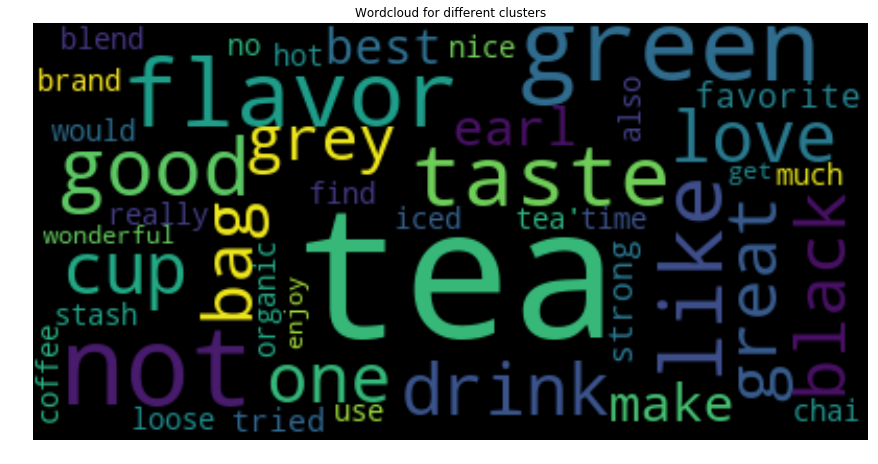

In [514]:
word_cloud(c1)

This cluster represents reviews about tea.
We can see that most repeated words are green tea,chai,taste,great,good etc

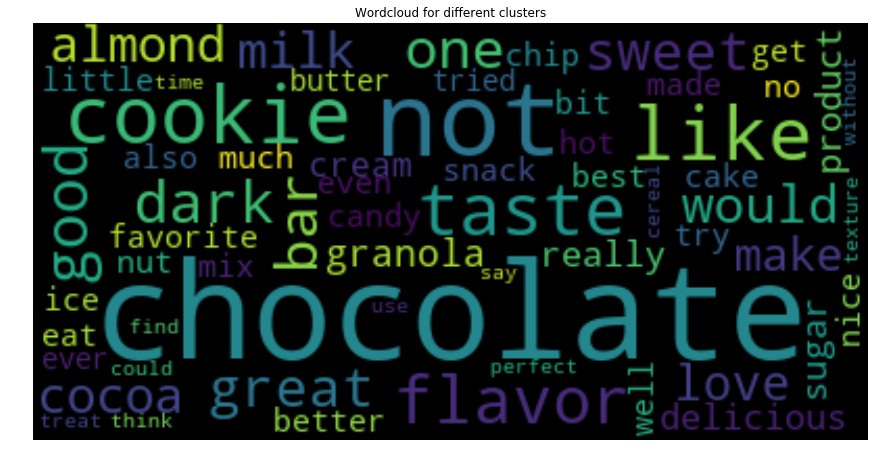

In [515]:
word_cloud(c2)

This cluster represents Chocolate,cookies and candy.
​
From the wordcloud we can say this product is good.
​
We can also observe different kinds of Chocolates such as dark chocolate,
hot chocolateetc,almond candy etc..

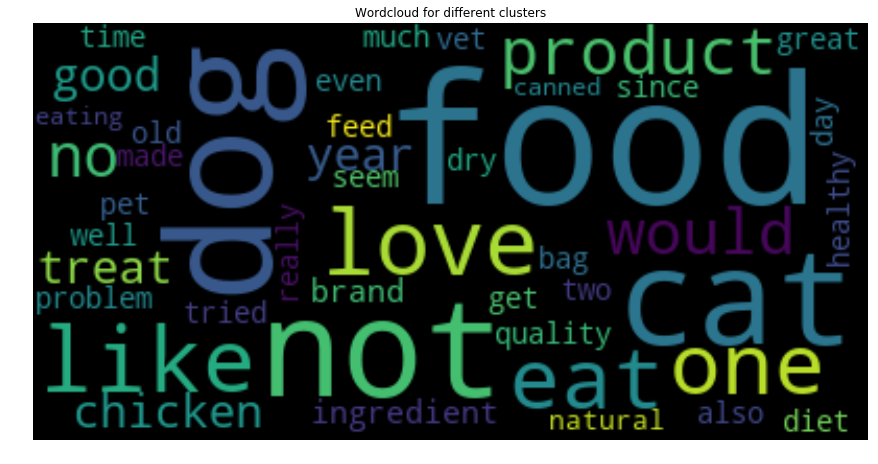

In [516]:
word_cloud(c3)

This cluster represents dog food.

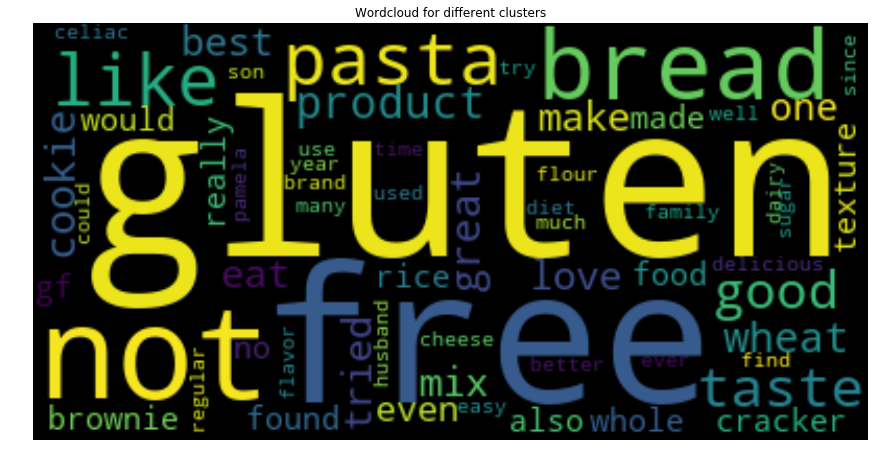

In [521]:
word_cloud(c4)

This cluster represents gluten free pasta.

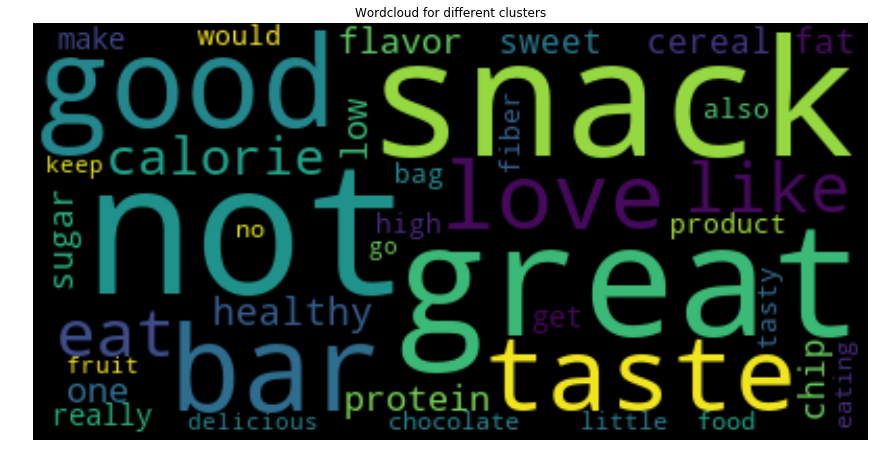

In [520]:
word_cloud(c5)

This cluster represents snacksy.

From the wordcloud we can say this product is good.




### [5.1.7] Applying K-Means Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [377]:
X=preprocessed_reviews[:50000]

In [378]:

i=0
list_of_sentance_train=[]
for sentance in X:
    list_of_sentance_train.append(sentance.split())

In [379]:
# this line of code trains your w2v model on the give list of sentances
w2v_model=Word2Vec(list_of_sentance_train,min_count=5,size=50, workers=4)

In [380]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors


In [381]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

# Converting Reviews into Numerical Vectors using W2V vectors
from tqdm import tqdm
import numpy as np

# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer(ngram_range=(1,2), min_df=10, dtype=np.float64,max_features = 500)
model.fit(X)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

X_tr2 = model.transform(X)

 #TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_train = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_train): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_train.append(sent_vec)
    row += 1

number of words that occured minimum 5 times  13402
sample words  ['dogs', 'loves', 'chicken', 'product', 'china', 'wont', 'buying', 'anymore', 'hard', 'find', 'products', 'made', 'usa', 'one', 'isnt', 'bad', 'good', 'take', 'chances', 'till', 'know', 'going', 'imports', 'love', 'saw', 'pet', 'store', 'tag', 'attached', 'regarding', 'satisfied', 'safe', 'infestation', 'literally', 'everywhere', 'flying', 'around', 'kitchen', 'bought', 'hoping', 'least', 'get', 'rid', 'weeks', 'fly', 'stuck', 'buggers', 'success', 'rate', 'day']


100%|███████████████████████████████████████████████████████████████████████████| 50000/50000 [02:44<00:00, 303.59it/s]


In [382]:
X_tr2 = tfidf_sent_vectors_train
X_tr_tfidf_w2v = np.array(X_tr2)


In [495]:

k_values = [5,10,20,30,40,50]
sum_sq_dist = []
for i in k_values:
    KM = KMeans(n_clusters=i, n_jobs=-1).fit(X_tr_tfidf_w2v)
    sum_sq_dist.append(KM.inertia_)

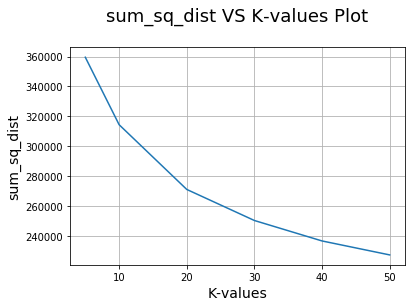

In [496]:

plt.plot(k_values, sum_sq_dist)
plt.xlabel('K-values',size=14)
plt.ylabel('sum_sq_dist',size=14)
plt.title('sum_sq_dist VS K-values Plot\n',size=18)
plt.grid()
plt.show()

In [386]:

optimal_k_tfidf_w2v = 20


# Implementing K-Means++ using optimal value of K
Kmeans_tfidf_w2v = KMeans(n_clusters=optimal_k_tfidf_w2v, n_jobs=-1).fit(X_tr_tfidf_w2v)

In [387]:
df1['cluster_tfidf_w2v'] = Kmeans_tfidf_w2v.labels_

In [388]:
for i in range(20):
    cluster = df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==i]
    print("Length of ",i,"th cluster:",len(cluster))

Length of  0 th cluster: 1514
Length of  1 th cluster: 2889
Length of  2 th cluster: 2563
Length of  3 th cluster: 1511
Length of  4 th cluster: 3592
Length of  5 th cluster: 3116
Length of  6 th cluster: 1381
Length of  7 th cluster: 3051
Length of  8 th cluster: 1311
Length of  9 th cluster: 936
Length of  10 th cluster: 4047
Length of  11 th cluster: 1412
Length of  12 th cluster: 1737
Length of  13 th cluster: 6329
Length of  14 th cluster: 512
Length of  15 th cluster: 4775
Length of  16 th cluster: 3267
Length of  17 th cluster: 2328
Length of  18 th cluster: 436
Length of  19 th cluster: 3293


In [433]:
#Considering only 5 random clusters.
c1 = []
c2 = []
c3 = []
c4 = []
c5 = []
c1 =  df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==0]
c2 =  df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==6]
c3 =  df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==2]
c4 =  df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==3]
c5 =  df1.preprocessed_reviews[df1['cluster_tfidf_w2v']==14]

### [5.1.8] Wordclouds of clusters obtained after applying k-means on TFIDF W2V<font color='red'> SET 4</font>

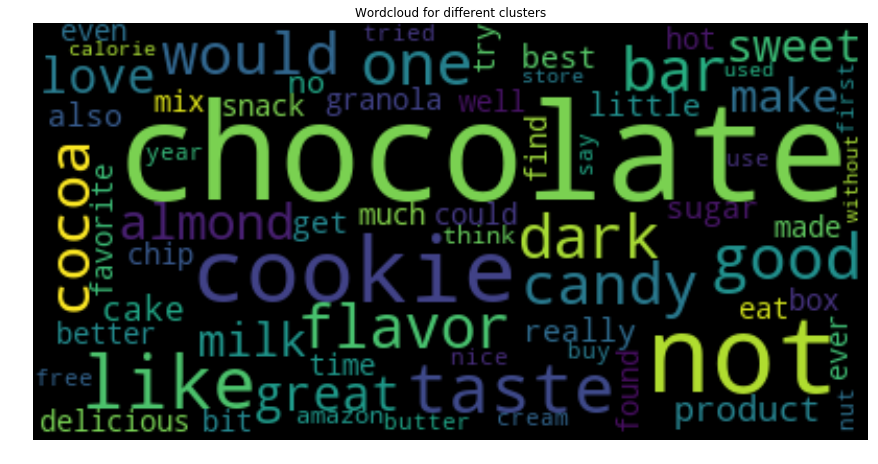

In [427]:
word_cloud(c1)

This cluster represents Chocolate,cookies and candy.

From the wordcloud we can say this product is good.

We can also observe different kinds of Chocolates such as dark chocolate,
hot chocolateetc,almond candy etc..


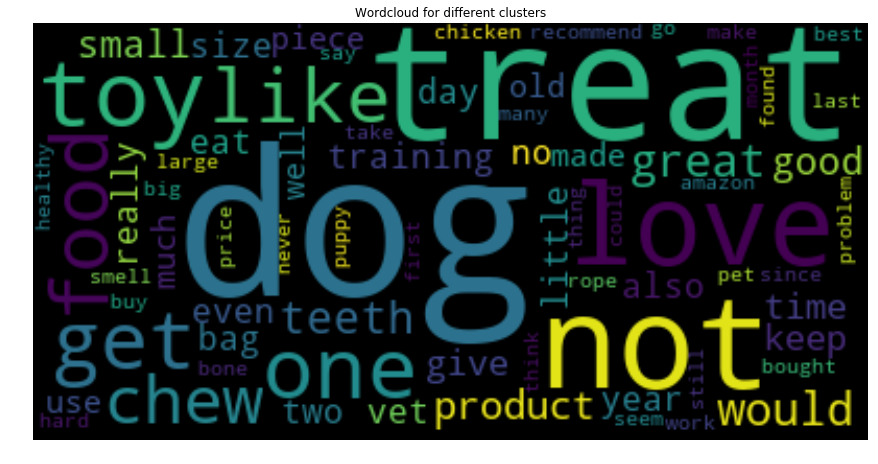

In [428]:
word_cloud(c2)

This cluster represents dog teeth/toys

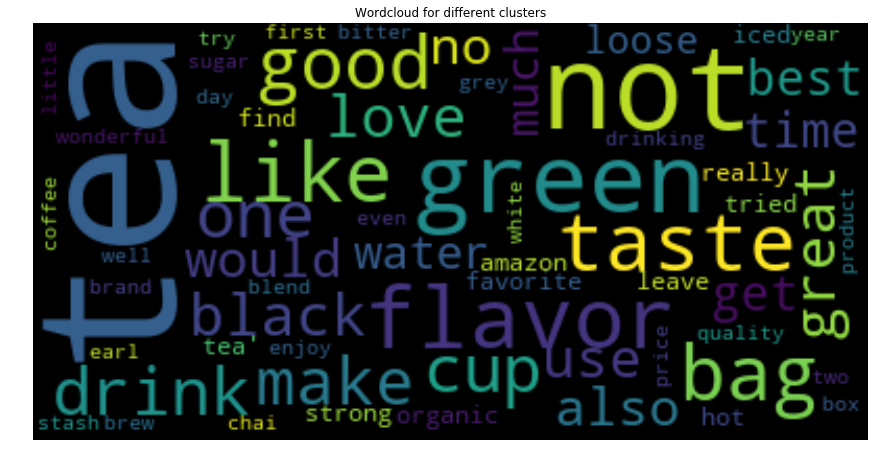

In [420]:
word_cloud(c3)

This cluster represents reviews about tea.
We can see that most repeated words are green tea,chai,taste,great,good etc

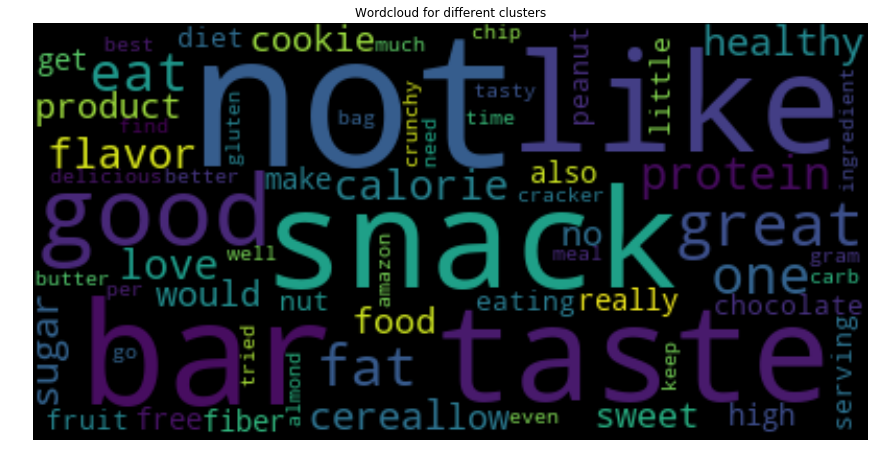

In [421]:
word_cloud(c4)

This Cluster represents snacks.
From the above cluster we can say that the product is not good.
snacks present  in this cluster chips,fruit,cereals etc

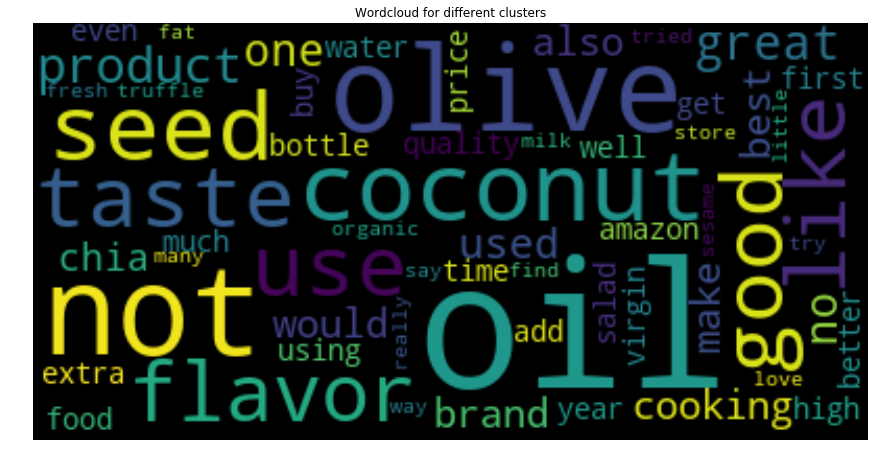

In [435]:
word_cloud(c5)

This cluster represents different kinds of oils such as olive oil,coconut oil etc..

## [5.2] Agglomerative Clustering

### [5.2.1] Applying Agglomerative Clustering on AVG W2V,<font color='red'> SET 3</font>

In [33]:
X=preprocessed_reviews[:5000]

In [34]:
# Preparing Reviews for gensim model
i=0
list_of_sentance=[]
for sentance in X:
    list_of_sentance.append(sentance.split())

In [35]:
from gensim.models import Word2Vec
from gensim.models import KeyedVectors


In [36]:
# this line of code trains your w2v model on the give list of sentances
w2v_model=Word2Vec(list_of_sentance,min_count=5,size=50, workers=4)

In [37]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

number of words that occured minimum 5 times  4248
sample words  ['dogs', 'loves', 'chicken', 'product', 'china', 'wont', 'buying', 'anymore', 'hard', 'find', 'products', 'made', 'usa', 'one', 'isnt', 'bad', 'good', 'take', 'chances', 'till', 'know', 'going', 'imports', 'love', 'saw', 'pet', 'store', 'tag', 'attached', 'regarding', 'satisfied', 'safe', 'infestation', 'literally', 'everywhere', 'flying', 'around', 'kitchen', 'bought', 'hoping', 'least', 'get', 'rid', 'weeks', 'fly', 'stuck', 'success', 'rate', 'day', 'clearly']


In [38]:
# Converting Reviews into Numerical Vectors using W2V vectors
from tqdm import tqdm
import numpy as np

In [39]:
# average Word2Vec
# compute average word2vec for each review.
sent_vectors = []; # the avg-w2v for each sentence/review is stored in this list
for sent in tqdm(list_of_sentance): # for each review/sentence
    sent_vec = np.zeros(50) # as word vectors are of zero length 50, you might need to change this to 300 if you use google's w2v
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words:
            vec = w2v_model.wv[word]
            sent_vec += vec
            cnt_words += 1
    if cnt_words != 0:
        sent_vec /= cnt_words
    sent_vectors.append(sent_vec)
sent_vectors = np.array(sent_vectors)
print(sent_vectors.shape)
print(sent_vectors[5])

100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:07<00:00, 630.69it/s]


(5000, 50)
[ 1.07162263e-01  1.69300069e-01 -6.83777568e-01 -2.67762217e-01
 -7.47382201e-01  1.19645735e-01  4.38493174e-01  9.44282392e-02
  1.90174283e-01 -5.74865392e-02  4.08664429e-01 -5.92828721e-01
  4.32315791e-01 -1.77189194e-01 -2.17991627e-01 -2.73397701e-01
  1.12125829e+00 -2.37029641e-01 -2.18927952e-01 -2.47156119e-02
  1.93307080e-01  1.70186083e-01  2.10582111e-01 -2.93947752e-01
  1.77373786e-01 -2.81566829e-01 -6.47386770e-01  3.15428830e-01
 -5.53133578e-01 -3.15262609e-01  5.49029111e-01 -2.45542772e-01
  1.54693022e-01 -1.04670896e-01 -1.01680355e+00 -3.57589714e-01
  4.53594157e-01 -5.55846807e-02  2.41092772e-01  7.29689235e-04
  3.13600732e-01  6.65802341e-02 -1.73984280e-01  1.13728834e-01
  1.17827786e-02  1.87780820e-01 -1.76304898e-01  5.93577251e-01
  2.87081252e-01 -1.96134913e-01]


In [40]:
X_w2v = sent_vectors


In [445]:
df2 = pd.DataFrame(X)
df2 = df2.rename(columns = {0 : 'preprocessed_reviews'})
df2.head(3)

,preprocessed_reviews
0,dogs loves chicken product china wont buying a...
1,dogs love saw pet store tag attached regarding...
2,infestation fruitflies literally everywhere fl...


In [446]:
#Agglomerative Clustering with 2 clusters..
from sklearn.cluster import AgglomerativeClustering

model = AgglomerativeClustering(n_clusters=2).fit(X_w2v)
   

In [447]:

model = AgglomerativeClustering(n_clusters=2).fit(X_w2v)
   
df2['cluster_agg_w2v'] = model.labels_

for i in range(2):
    cluster = df2.preprocessed_reviews[df2['cluster_agg_w2v']==i]
    print("Length of ",i,"th cluster:",len(cluster))
# Getting all the reviews in different clusters
c_1 = []
c_2 = []


c_1 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==0]
c_2 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==1]


Length of  0 th cluster: 1377
Length of  1 th cluster: 3623


### [5.2.2] Wordclouds of clusters obtained after applying Agglomerative Clustering on AVG W2V<font color='red'> SET 3</font>

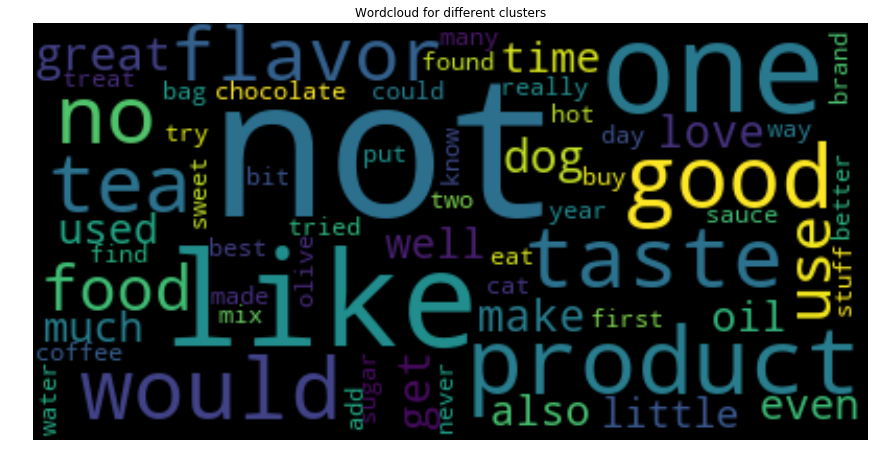

In [448]:
word_cloud(c_1)

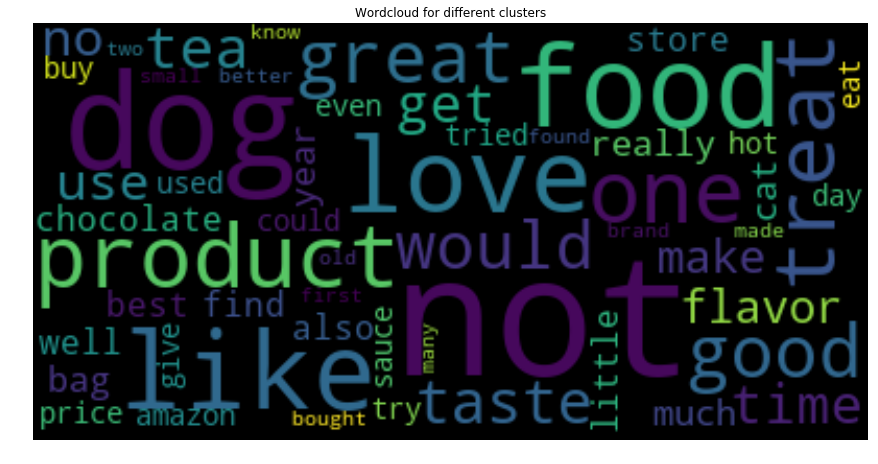

In [449]:
word_cloud(c_2)

In [450]:

model = AgglomerativeClustering(n_clusters=5).fit(X_w2v)
   
df2['cluster_agg_w2v'] = model.labels_

for i in range(5):
    cluster = df2.preprocessed_reviews[df2['cluster_agg_w2v']==i]
    print("Length of ",i,"th cluster:",len(cluster))
# Getting all the reviews in different clusters
c_1 = []
c_2 = []
c_3 = []
c_4 = []
c_5 = []

c_1 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==0]
c_2 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==1]

c_3 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==2]
c_4 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==3]

c_5 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==4]
            

Length of  0 th cluster: 967
Length of  1 th cluster: 1962
Length of  2 th cluster: 10
Length of  3 th cluster: 694
Length of  4 th cluster: 1367


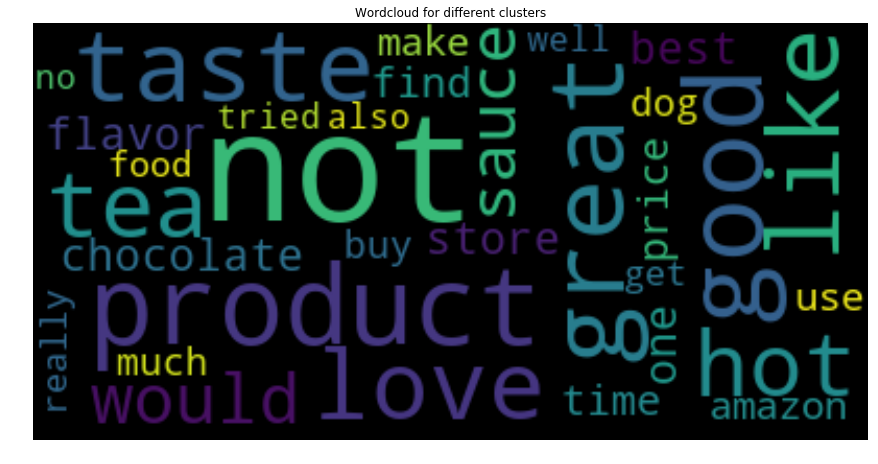

In [451]:
word_cloud(c_1)

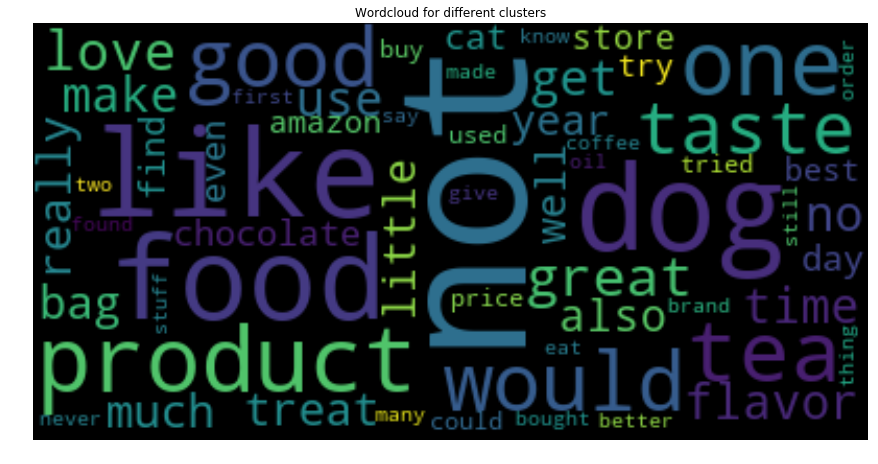

In [452]:
word_cloud(c_2)

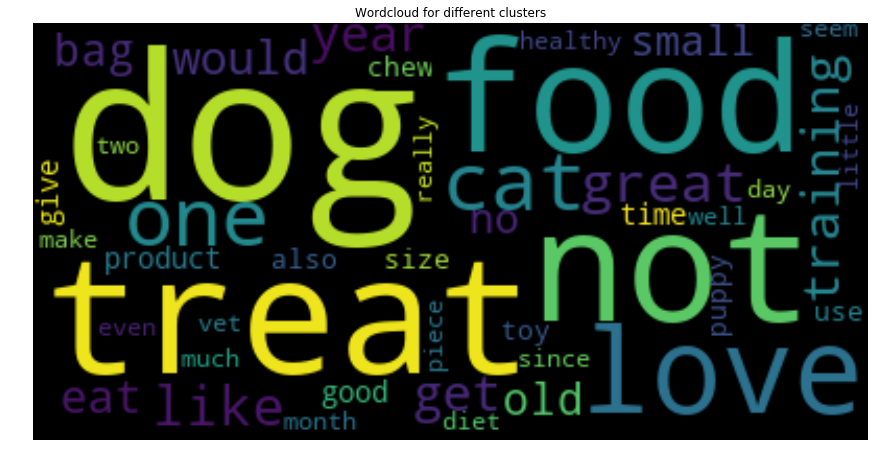

In [454]:
word_cloud(c_4)

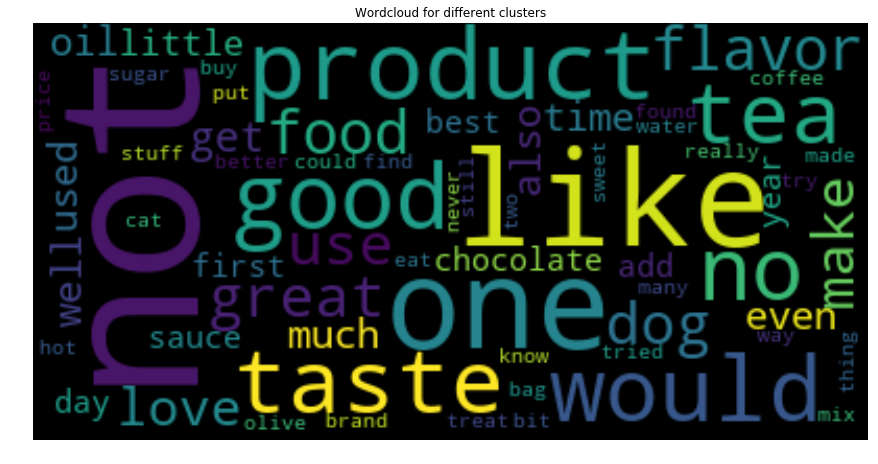

In [455]:
word_cloud(c_5)

In [456]:

model = AgglomerativeClustering(n_clusters=7).fit(X_w2v)
   
df2['cluster_agg_w2v'] = model.labels_

for i in range(7):
    cluster = df2.preprocessed_reviews[df2['cluster_agg_w2v']==i]
    print("Length of ",i,"th cluster:",len(cluster))
# Getting all the reviews in different clusters
c_1 = []
c_2 = []
c_3 = []
c_4 = []
c_5 = []
c_6 = []
c_7 = []

c_1 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==0]
c_2 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==1]

c_3 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==2]
c_4 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==3]

c_5 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==4]
c_6 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==5]

c_7 =  df2.preprocessed_reviews[df2['cluster_agg_w2v']==6]
                        
    
    

Length of  0 th cluster: 1367
Length of  1 th cluster: 1486
Length of  2 th cluster: 430
Length of  3 th cluster: 694
Length of  4 th cluster: 537
Length of  5 th cluster: 10
Length of  6 th cluster: 476


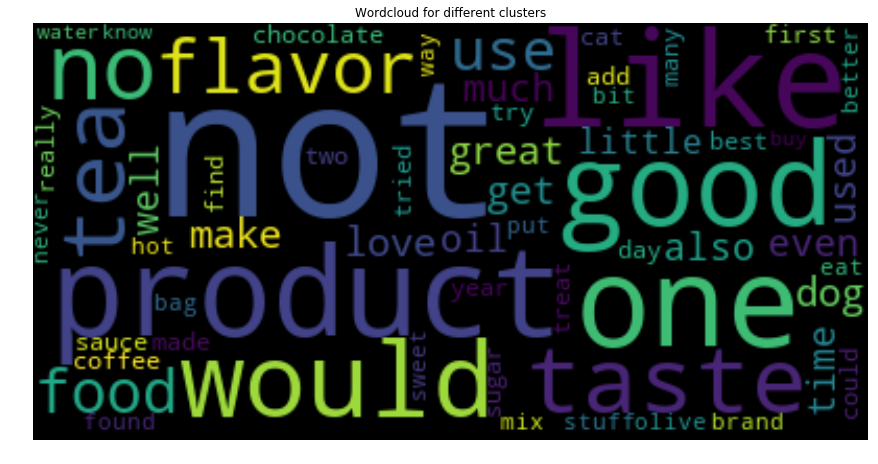

In [457]:
word_cloud(c_1)

This cluster has reviews about tea,sausee,coffee etc..

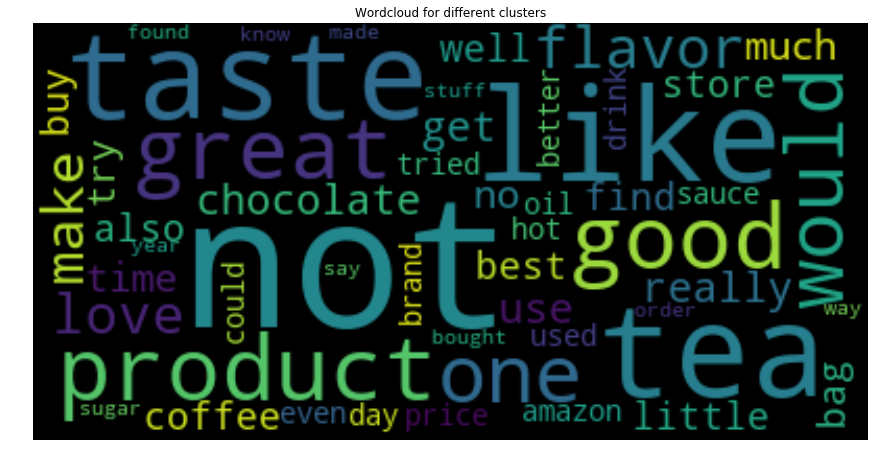

In [458]:
word_cloud(c_2)

This cluster contain reviews about chocolate,tea,coffee etc..

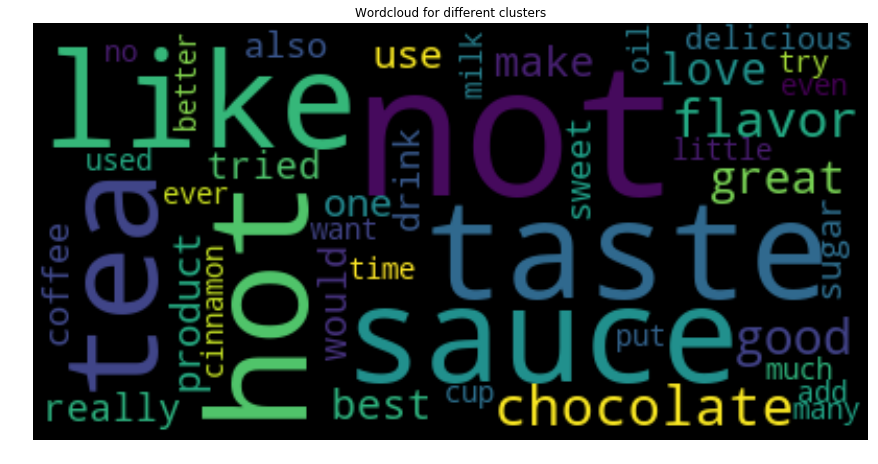

In [459]:
word_cloud(c_3)

This cluster represents chocolates,tea and sauces.

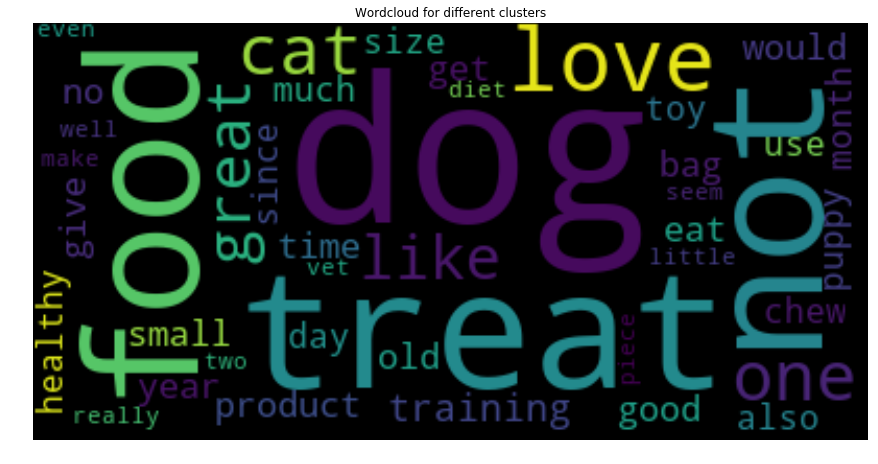

In [460]:
word_cloud(c_4)

This cluster contain reviews about doog food,cats,puppy.

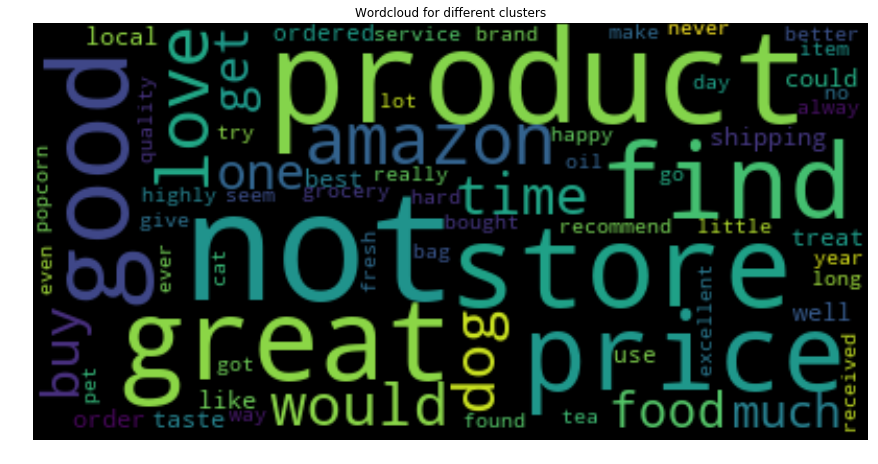

In [461]:
word_cloud(c_5)

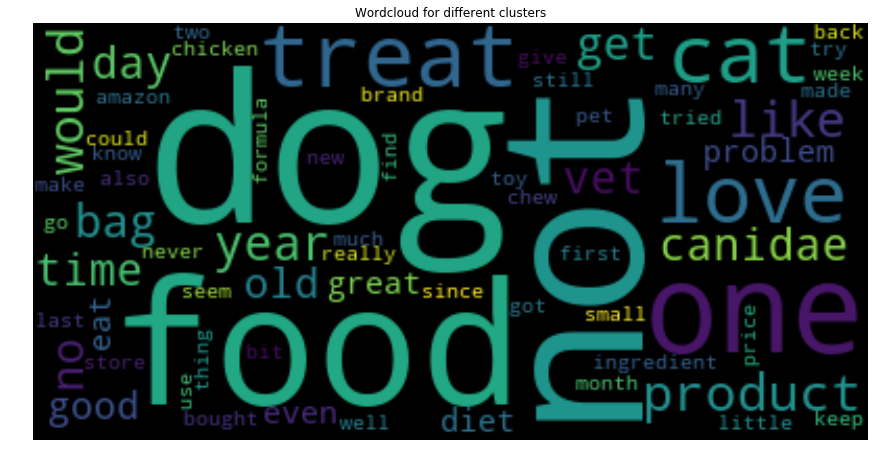

In [463]:
word_cloud(c_7)

This cluster represents dog food.

### [5.2.3] Applying Agglomerative Clustering on TFIDF W2V,<font color='red'> SET 4</font>

In [74]:
# Preparing Reviews for gensim model
i=0
list_of_sentance_train=[]
for sentance in X:
    list_of_sentance_train.append(sentance.split())

In [75]:
w2v_words = list(w2v_model.wv.vocab)
print("number of words that occured minimum 5 times ",len(w2v_words))
print("sample words ", w2v_words[0:50])

# Converting Reviews into Numerical Vectors using W2V vectors
from tqdm import tqdm
import numpy as np

# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
model = TfidfVectorizer(ngram_range=(1,2), min_df=10, dtype=np.float64,max_features = 500)
model.fit(X)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(model.get_feature_names(), list(model.idf_)))

X_tr2 = model.transform(X)

 #TF-IDF weighted Word2Vec
tfidf_feat = model.get_feature_names() # tfidf words/col-names
# final_tf_idf is the sparse matrix with row= sentence, col=word and cell_val = tfidf

tfidf_sent_vectors_train = []; # the tfidf-w2v for each sentence/review is stored in this list
row=0;
for sent in tqdm(list_of_sentance_train): # for each review/sentence 
    sent_vec = np.zeros(50) # as word vectors are of zero length
    weight_sum =0; # num of words with a valid vector in the sentence/review
    for word in sent: # for each word in a review/sentence
        if word in w2v_words and word in tfidf_feat:
            vec = w2v_model.wv[word]
#             tf_idf = tf_idf_matrix[row, tfidf_feat.index(word)]
            # to reduce the computation we are 
            # dictionary[word] = idf value of word in whole courpus
            # sent.count(word) = tf valeus of word in this review
            tf_idf = dictionary[word]*(sent.count(word)/len(sent))
            sent_vec += (vec * tf_idf)
            weight_sum += tf_idf
    if weight_sum != 0:
        sent_vec /= weight_sum
    tfidf_sent_vectors_train.append(sent_vec)
    row += 1

number of words that occured minimum 5 times  4248
sample words  ['dogs', 'loves', 'chicken', 'product', 'china', 'wont', 'buying', 'anymore', 'hard', 'find', 'products', 'made', 'usa', 'one', 'isnt', 'bad', 'good', 'take', 'chances', 'till', 'know', 'going', 'imports', 'love', 'saw', 'pet', 'store', 'tag', 'attached', 'regarding', 'satisfied', 'safe', 'infestation', 'literally', 'everywhere', 'flying', 'around', 'kitchen', 'bought', 'hoping', 'least', 'get', 'rid', 'weeks', 'fly', 'stuck', 'success', 'rate', 'day', 'clearly']


100%|█████████████████████████████████████████████████████████████████████████████| 5000/5000 [00:09<00:00, 541.79it/s]


In [76]:
X_tr2 = tfidf_sent_vectors_train
X_tr_tfidf_w2v = np.array(X_tr2)


In [306]:

model = AgglomerativeClustering(n_clusters=2).fit(X_tr_tfidf_w2v)

#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20clustering%20%20on%20Amazon%20Food%20Reviews.ipynb
# Getting all the reviews in different clusters
C_1 = []
C_2 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        C_1.append(X[i])
    else :
        C_2.append(X[i])
    

In [310]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(C_1))
print("\nNo. of reviews in Cluster-2 : ",len(C_2))

No. of reviews in Cluster-1 :  4015

No. of reviews in Cluster-2 :  985


### [5.2.4] Wordclouds of clusters obtained after applying Agglomerative Clustering on TFIDF W2V<font color='red'> SET 4</font>

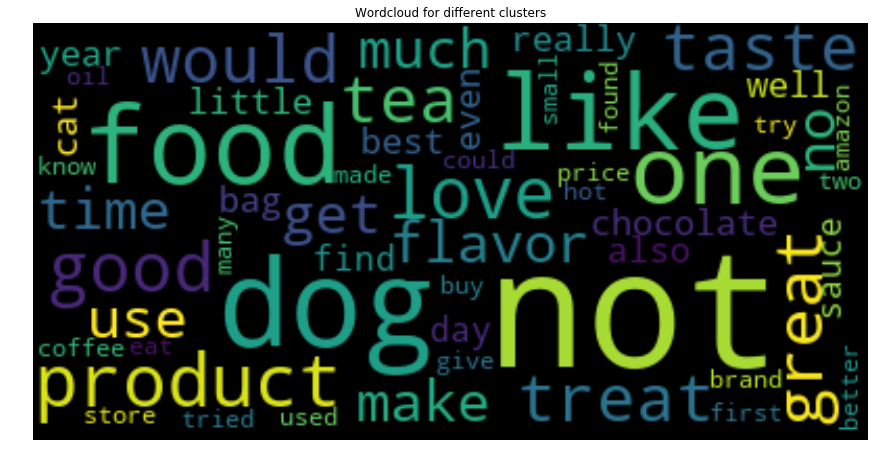

In [308]:
word_cloud(C_1)

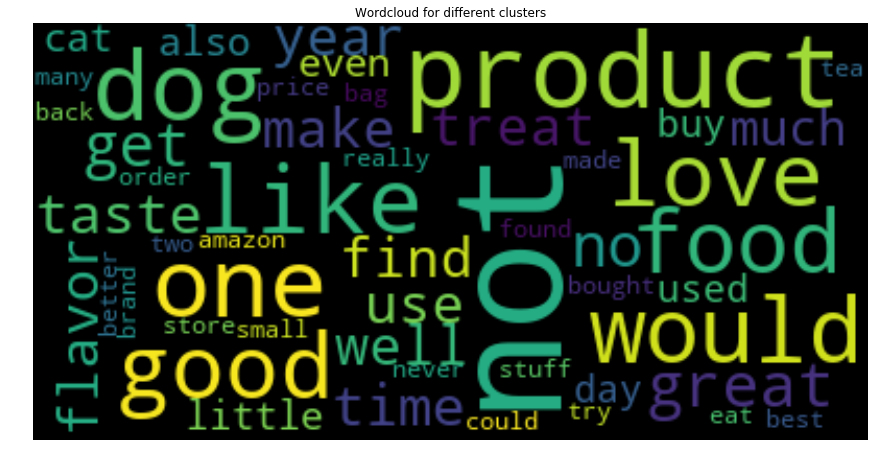

In [309]:
word_cloud(C_2)

In [350]:
model = AgglomerativeClustering(n_clusters=5).fit(X_tr_tfidf_w2v)
# Getting all the reviews in different clusters
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20clustering%20%20on%20Amazon%20Food%20Reviews.ipynb
C_1 = []
C_2 = []
C_3 = []
C_4 = []
C_5 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        C_1.append(X[i])
    elif model.labels_[i] == 1:
        C_2.append(X[i])
    elif model.labels_[i] == 2:
        C_3.append(X[i])
    elif model.labels_[i] == 3:
        C_4.append(X[i])
    
    elif model.labels_[i] == 4:
        C_5.append(X[i]) 

In [351]:

# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(C_1))
print("\nNo. of reviews in Cluster-2 : ",len(C_2))
print("\nNo. of reviews in Cluster-3 : ",len(C_3))
print("\nNo. of reviews in Cluster-4 : ",len(C_4))
print("\nNo. of reviews in Cluster-5 : ",len(C_5))


No. of reviews in Cluster-1 :  1216

No. of reviews in Cluster-2 :  1697

No. of reviews in Cluster-3 :  1102

No. of reviews in Cluster-4 :  975

No. of reviews in Cluster-5 :  10


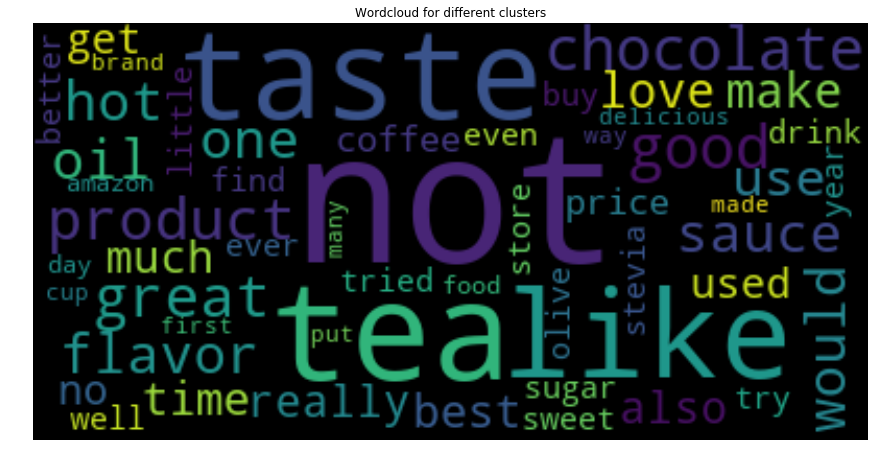

In [352]:
word_cloud(C_1)

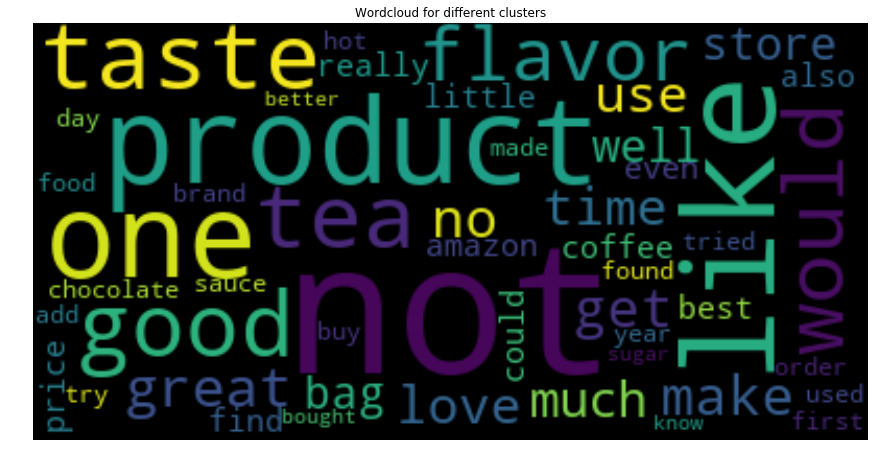

In [353]:
word_cloud(C_2)

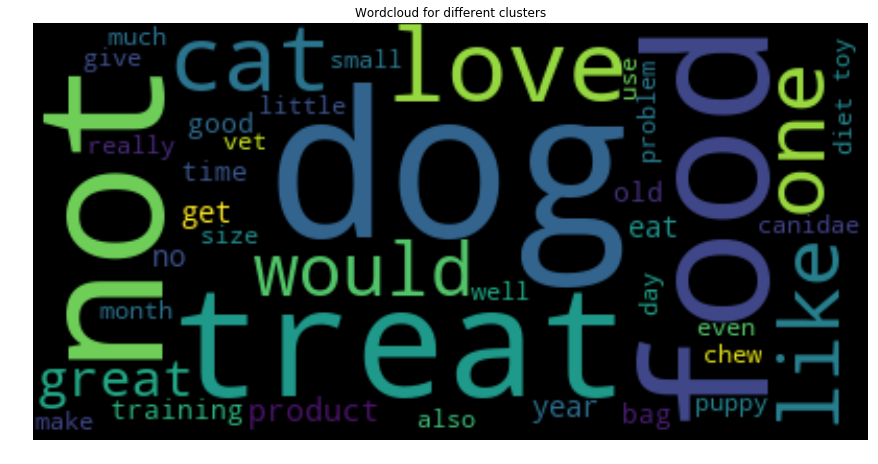

In [354]:
word_cloud(C_3)

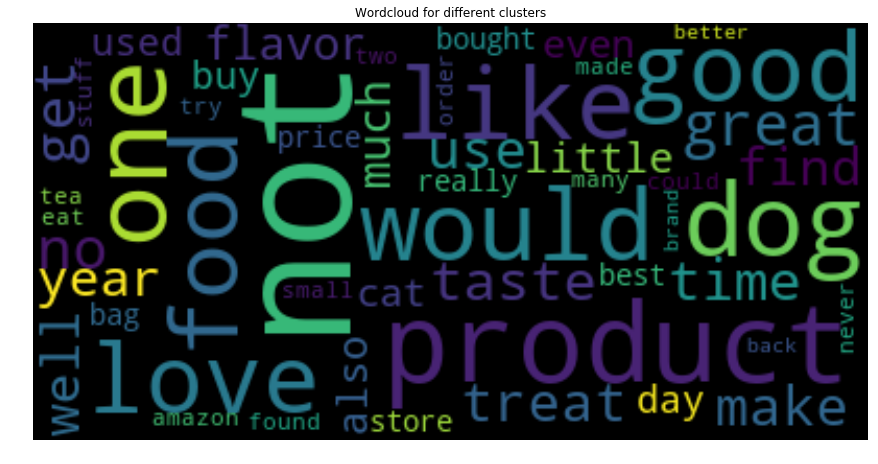

In [355]:
word_cloud(C_4)

In [356]:
model = AgglomerativeClustering(n_clusters=7).fit(X_tr_tfidf_w2v)
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20clustering%20%20on%20Amazon%20Food%20Reviews.ipynb
# Getting all the reviews in different clusters
C_1 = []
C_2 = []
C_3 = []
C_4 = []
C_5 = []
C_6 = []
C_7 = []

for i in range(model.labels_.shape[0]):
    if model.labels_[i] == 0:
        C_1.append(X[i])
    elif model.labels_[i] == 1:
        C_2.append(X[i])
    elif model.labels_[i] == 2:
        C_3.append(X[i])
    elif model.labels_[i] == 3:
        C_4.append(X[i])
    elif model.labels_[i] == 4:
        C_5.append(X[i])    
        
    elif model.labels_[i] == 5:
        C_6.append(X[i])   
        
    else:
        C_7.append(X[i]) 

In [321]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(C_1))
print("\nNo. of reviews in Cluster-2 : ",len(C_2))
print("\nNo. of reviews in Cluster-3 : ",len(C_3))
print("\nNo. of reviews in Cluster-4 : ",len(C_4))
print("\nNo. of reviews in Cluster-5 : ",len(C_5))
print("\nNo. of reviews in Cluster-6 : ",len(C_6))

print("\nNo. of reviews in Cluster-7 : ",len(C_7))


No. of reviews in Cluster-1 :  1697

No. of reviews in Cluster-2 :  975

No. of reviews in Cluster-3 :  949

No. of reviews in Cluster-4 :  349

No. of reviews in Cluster-5 :  10

No. of reviews in Cluster-6 :  267

No. of reviews in Cluster-7 :  753


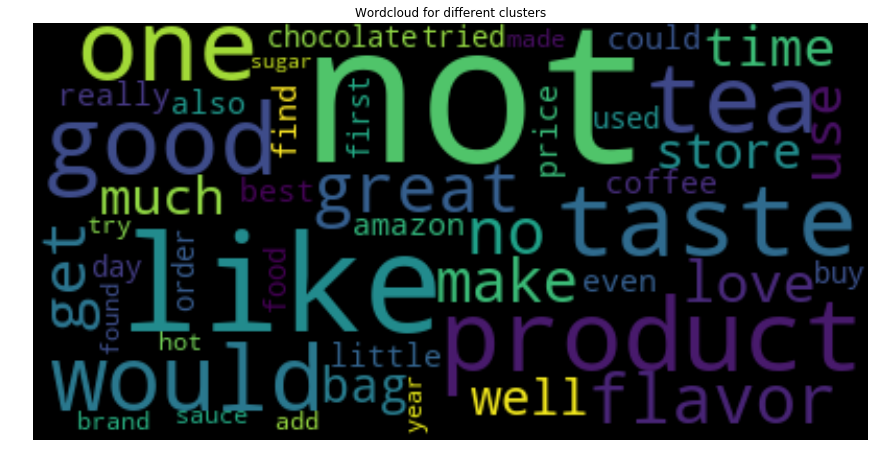

In [322]:
word_cloud(C_1)

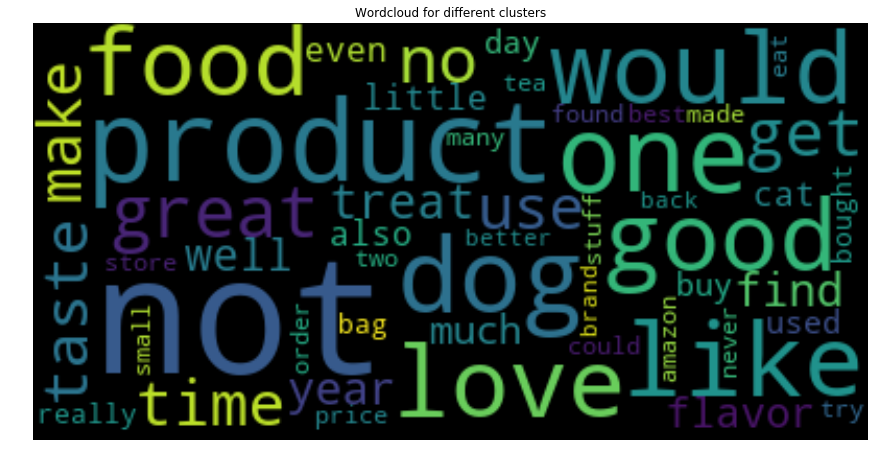

In [323]:
word_cloud(C_2)

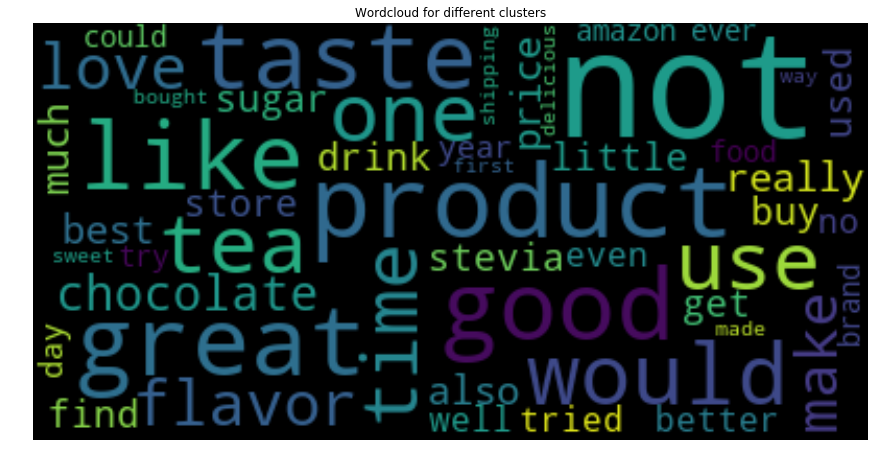

In [324]:
word_cloud(C_3)

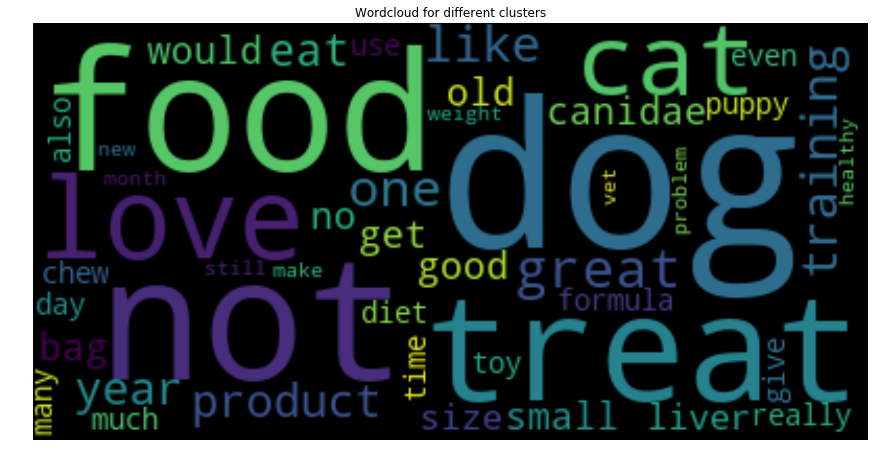

In [325]:
word_cloud(C_4)

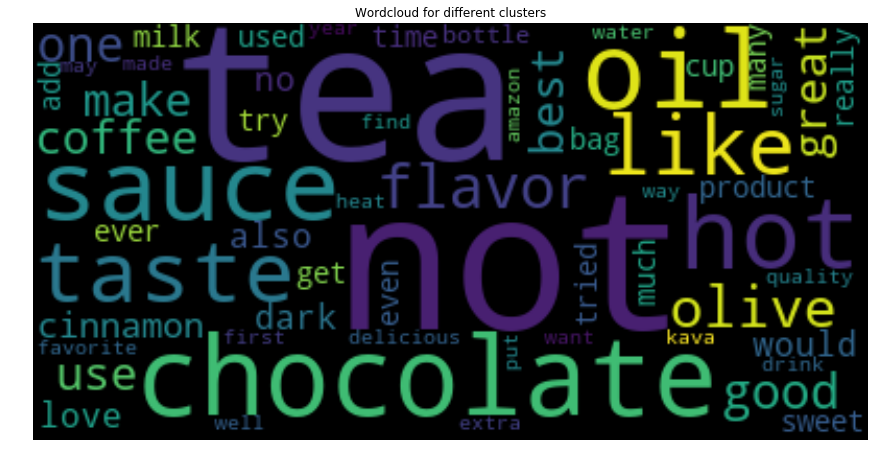

In [326]:
word_cloud(C_6)

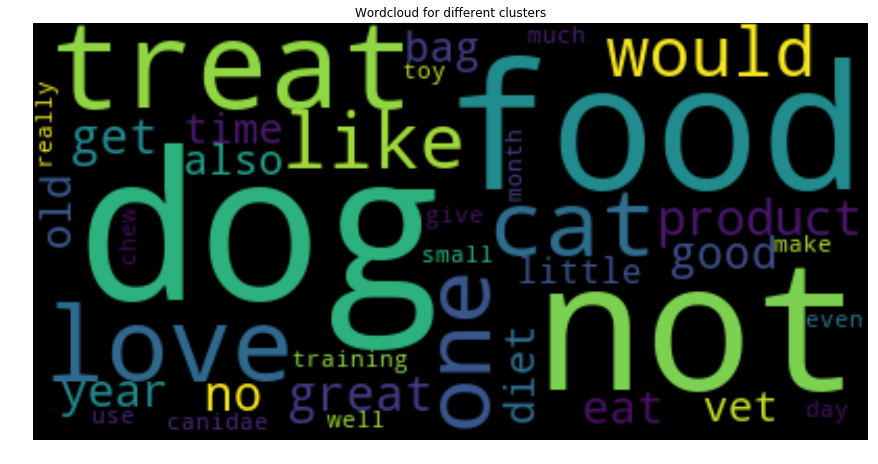

In [327]:
word_cloud(C_7)

## [5.3] DBSCAN Clustering

### [5.3.1] Applying DBSCAN on AVG W2V,<font color='red'> SET 3</font>

In [61]:
from sklearn.cluster import DBSCAN
from sklearn import metrics


In [62]:
#calculating min_points.
min_points = 2*X_w2v.shape[1]


#Determining the distance of nth-nearest neighbour to all points.
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20DBSCAN%20on%20Amazon%20Fine%20Food%20Reviews.ipynb
distance = []
for point in X_w2v:
    temp = np.sort(np.sum((X_w2v-point)**2,axis=1),axis=None)
    distance.append(temp[min_points])
d_i =  np.sqrt(np.array(distance))

#sorting distances.
sorted_d_i = np.sort(d_i)
points_index = [i for i in range(X_w2v.shape[0])]


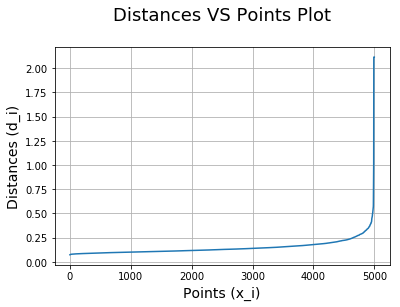

In [63]:

# Ploting distances(d_i) VS points(x_i).
plt.plot(points_index, sorted_d_i)
plt.xlabel('Points (x_i)',size=14)
plt.ylabel('Distances (d_i)',size=14)
plt.title('Distances VS Points Plot\n',size=18)
plt.grid()
plt.show()

In [64]:
from sklearn.cluster import DBSCAN
from sklearn import metrics



min_points = 2*X_w2v.shape[1]
#computing silhouette_score for eps_val.. 
print("min_points : ",min_points)
eps_val = [0.25,0.27,0.30,0.35,0.4]
score = []
for i in eps_val:
    db = DBSCAN(eps=i, min_samples=min_points).fit(X_w2v)
    score.append(metrics.silhouette_score(X_w2v, db.labels_))

min_points :  100


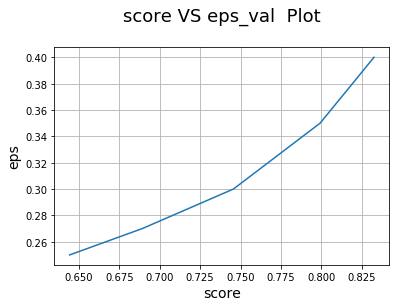

In [65]:
#plot for 'score VS eps_val'
plt.plot(score, eps_val)
plt.xlabel('score',size=14)
plt.ylabel('eps',size=14)
plt.title('score VS eps_val  Plot\n',size=18)
plt.grid()
plt.show()

In [312]:
optimal_eps = 0.30

In [66]:
db = DBSCAN(eps=optimal_eps, min_samples=min_points).fit(X_w2v)
set(db.labels_)

{-1, 0}

In [67]:
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20clustering%20%20on%20Amazon%20Food%20Reviews.ipynb
# Getting all the reviews in different clusters
C_1 = []
C_2 = []

for i in range(db.labels_.shape[0]):
    if db.labels_[i] == 0:
        C_1.append(X[i])
   
    else :
        C_2.append(X[i])    
        


In [68]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(C_1))
print("\nNo. of reviews in Cluster-2 : ",len(C_2))



No. of reviews in Cluster-1 :  4937

No. of reviews in Cluster-2 :  63


### [5.3.2] Wordclouds of clusters obtained after applying DBSCAN on AVG W2V<font color='red'> SET 3</font>

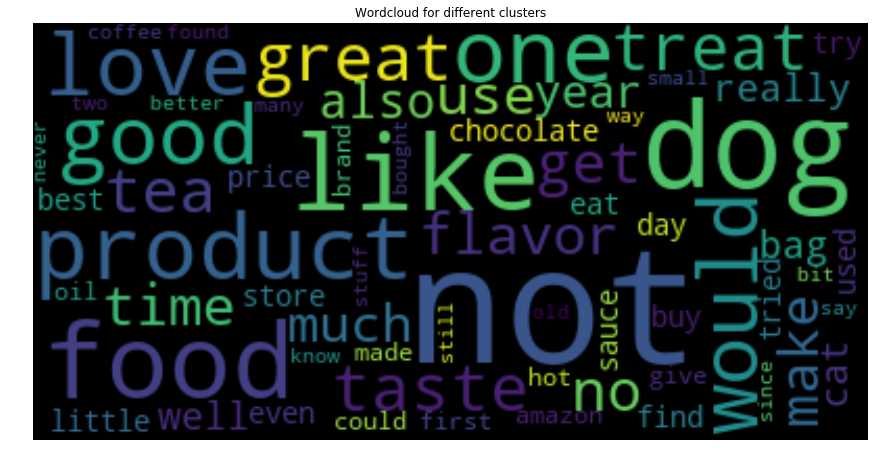

In [71]:
word_cloud(C_1)

This cluster represents dog food,tea chocolate etc

DBScan gives only two clusters, one cluster with all the points and other is noisy points

### [5.3.3] Applying DBSCAN on TFIDF W2V,<font color='red'> SET 4</font>

In [77]:
min_points = 2*X_tr_tfidf_w2v.shape[1]


#Determining the distance of nth-nearest neighbour to all points.
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20DBSCAN%20on%20Amazon%20Fine%20Food%20Reviews.ipynb
distance = []
for point in X_tr_tfidf_w2v:
    temp = np.sort(np.sum((X_tr_tfidf_w2v-point)**2,axis=1),axis=None)
    distance.append(temp[min_points])
d_i =  np.sqrt(np.array(distance))

# Computing distances of nth-nearest neighbours
sorted_d_i = np.sort(d_i)
points_index = [i for i in range(X_tr_tfidf_w2v.shape[0])]

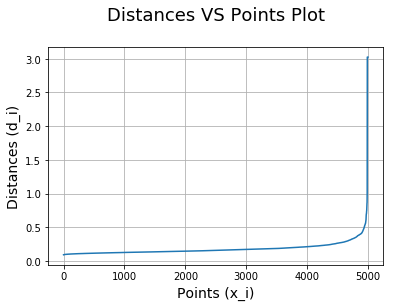

In [78]:

# Draw distances(d_i) VS points(x_i) plot
plt.plot(points_index, sorted_d_i)
plt.xlabel('Points (x_i)',size=14)
plt.ylabel('Distances (d_i)',size=14)
plt.title('Distances VS Points Plot\n',size=18)
plt.grid()
plt.show()

In [80]:
from sklearn.cluster import DBSCAN
from sklearn import metrics

#computing silhouette_score for eps_val.. 
print("min_points : ",min_points)
eps_val = [0.25,0.27,0.30,0.35,0.4,0.45]
score1 = []
for i in eps_val:
    db = DBSCAN(eps=i, min_samples=min_points).fit(X_tr_tfidf_w2v)
    score1.append(metrics.silhouette_score(X_tr_tfidf_w2v, db.labels_))

min_points :  100


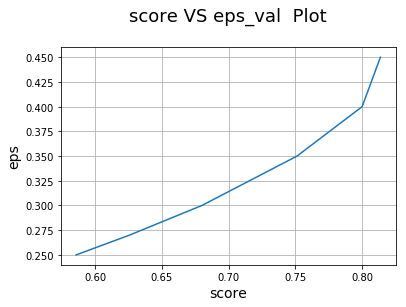

In [81]:

plt.plot(score1, eps_val)
plt.xlabel('score',size=14)
plt.ylabel('eps',size=14)
plt.title('score VS eps_val  Plot\n',size=18)
plt.grid()
plt.show()

In [82]:
optimal_eps = 0.4

In [85]:
db = DBSCAN(eps=optimal_eps, min_samples=min_points).fit(X_tr_tfidf_w2v)
db

DBSCAN(algorithm='auto', eps=0.4, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=100, n_jobs=1, p=None)

In [86]:
#https://github.com/PushpendraSinghChauhan/Amazon-Fine-Food-Reviews/blob/master/Apply%20clustering%20%20on%20Amazon%20Food%20Reviews.ipynb
# Getting all the reviews in different clusters
C_1 = []
C_2 = []

for i in range(db.labels_.shape[0]):
    if db.labels_[i] == 0:
        C_1.append(X[i])
   
    else :
        C_2.append(X[i])    
        


In [87]:
# Number of reviews in different clusters
print("No. of reviews in Cluster-1 : ",len(C_1))
print("\nNo. of reviews in Cluster-2 : ",len(C_2))



No. of reviews in Cluster-1 :  4978

No. of reviews in Cluster-2 :  22


### [5.3.4] Wordclouds of clusters obtained after applying DBSCAN on TFIDF W2V<font color='red'> SET 4</font>

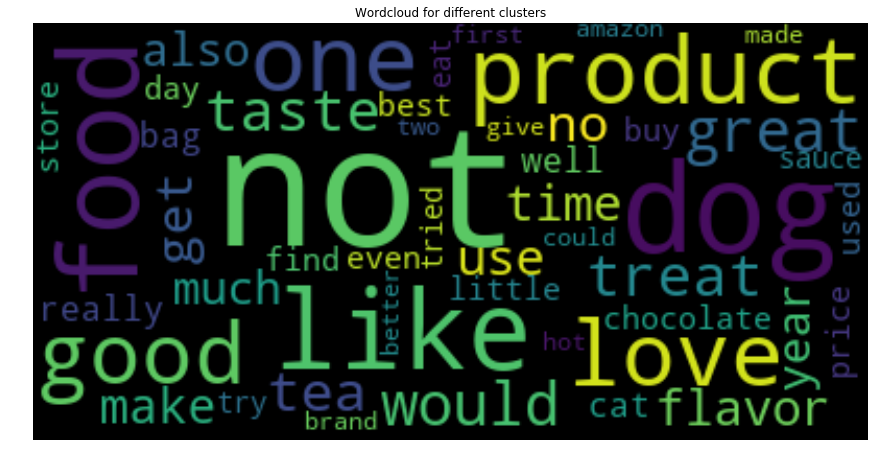

In [88]:
word_cloud(C_1)

This cluster has tea,cat food,chocolate,dog food etc

# [6] Conclusions

In [95]:
#comparing all your models using Prettytable library
from prettytable import PrettyTable
PTable = PrettyTable()
PTable.field_names = ["Vectorizor","Model", "Hyperparameter--K(number of clusters)"]

In [525]:
PTable.add_row(['BoW','Kmeans',20])

PTable.add_row(['TF-IDF','Kmeans',10])
PTable.add_row(['AVG W2V','Kmeans',20])
PTable.add_row(['TFIDF_W2V','Kmeans',20])


print(PTable)

+------------+--------+---------------------------------------+
| Vectorizor | Model  | Hyperparameter--K(number of clusters) |
+------------+--------+---------------------------------------+
|    BoW     | Kmeans |                   20                  |
|   TF-IDF   | Kmeans |                   10                  |
|  AVG W2V   | Kmeans |                   20                  |
| TFIDF_W2V  | Kmeans |                   20                  |
+------------+--------+---------------------------------------+


In [533]:
PTable1 = PrettyTable()
PTable1.field_names = ["Vectorizor","Model", "Hyperparameter--K(number of clusters)"]

In [534]:

PTable1.add_row(['AVG W2V','Agglomerative Clustering','2,5,7'])
PTable1.add_row(['TFIDF_W2V','Agglomerative Clustering','2,5,7'])


print(PTable1)

+------------+--------------------------+---------------------------------------+
| Vectorizor |          Model           | Hyperparameter--K(number of clusters) |
+------------+--------------------------+---------------------------------------+
|  AVG W2V   | Agglomerative Clustering |                 2,5,7                 |
| TFIDF_W2V  | Agglomerative Clustering |                 2,5,7                 |
+------------+--------------------------+---------------------------------------+


In [96]:
PTable1 = PrettyTable()
PTable1.field_names = ["Vectorizor","Model", "eps(hyperparameter)"]

In [97]:

PTable1.add_row(['AVG W2V',' DBSCAN',0.3])
PTable1.add_row(['TFIDF_W2V',' DBSCAN',0.4])


print(PTable1)

+------------+---------+---------------------+
| Vectorizor |  Model  | eps(hyperparameter) |
+------------+---------+---------------------+
|  AVG W2V   |  DBSCAN |         0.3         |
| TFIDF_W2V  |  DBSCAN |         0.4         |
+------------+---------+---------------------+


# Procedure

* First I loaded the data from SQLite Database.

2. Data Cleaning: 
Deduplication - duplicates are removed

3. Preprocessing: 
It is done to remove html tags, punctuations or limited set of special characters ,Stopwords etc.
Preprocessing is performed on review text and summary text.


* In this analysis kmeans is applied on Bag of Words,TF-IDF,Avg-W2v,TFIDF-W2v vectorizers.
5. And Agglomerative Clustering and DBscan are applied on Avg-W2v,TFIDF-W2v vectorizers.
4. In kmeans hyperparameter tuning is performed on k(number of clusters).
5. For only 5 random clusters obtained WORD CLOUDS for each featurization.
5. In Agglomerative Clustering for 2,5 and 7 clusters obtained  WORD CLOUDS for Avg-W2v,TFIDF-W2v featurizations.
6. In DBSCAN  hyperparameter tuning is performed on (eps).
6. Finally obtained Word cloud for dbscan.
8. DBScan gives only two clusters, one cluster with all the points and other is noisy points.
